## Visualise

### Service Count

### Overall Rare Disease

#### Visualise Quarterly

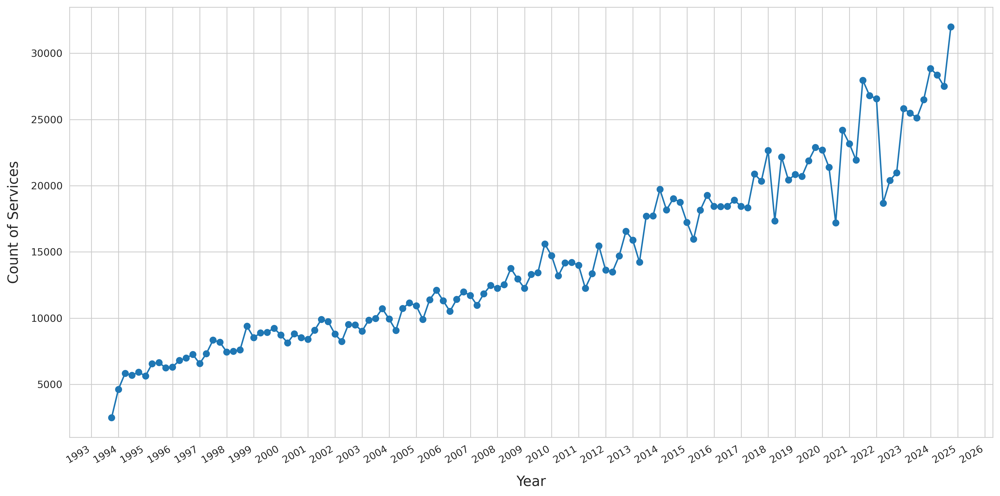

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from pandas.plotting import register_matplotlib_converters

# Inline plotting for Jupyter
%matplotlib inline

register_matplotlib_converters()

# -- Load and prepare the data --
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Convert Month column to datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only the specific item categories
items_to_include = [
    '73287', '73289', '73292', '73298', '73299',
    '73358', '73359', '73360', '73395', '73401',
    '73402', '73422', '73425', '73426', '73442',
    '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)]

# Aggregate 'Value' by quarter across all items and states (using 'QE' for quarter-end)
quarterly_data = filtered_data['Value'].resample('QE').sum()

# -- Plotting --
# Use Seaborn to set a clean style
sns.set_style('whitegrid')

# Create figure and axis
fig, ax = plt.subplots(figsize=(14, 7), dpi=300)  # higher DPI for better print quality

# Plot the resampled data
ax.plot(quarterly_data.index, quarterly_data, marker='o', linestyle='-', color='#1f77b4')

# Title and labels
# ax.set_title('Quarterly Sum of Value Over Time', fontsize=16, pad=15)
ax.set_xlabel('Year', fontsize=14, labelpad=10)
ax.set_ylabel('Count of Services', fontsize=14, labelpad=10)

# Configure the x-axis to show one major tick per year and minor ticks each quarter
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_minor_locator(mdates.MonthLocator(bymonth=(1, 4, 7, 10)))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Improve the layout and the angle of x-axis labels
fig.autofmt_xdate()

plt.tight_layout()

# Display inline in Jupyter Notebook
plt.show()

# -- Save the figure as an SVG --
fig.savefig("QuarterlyValuePlot.svg", format='svg', dpi=300)


#### Visualise Annually

/tmp/ipykernel_950/2145223016.py:30: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_data = filtered_data['Value'].resample('A').sum()


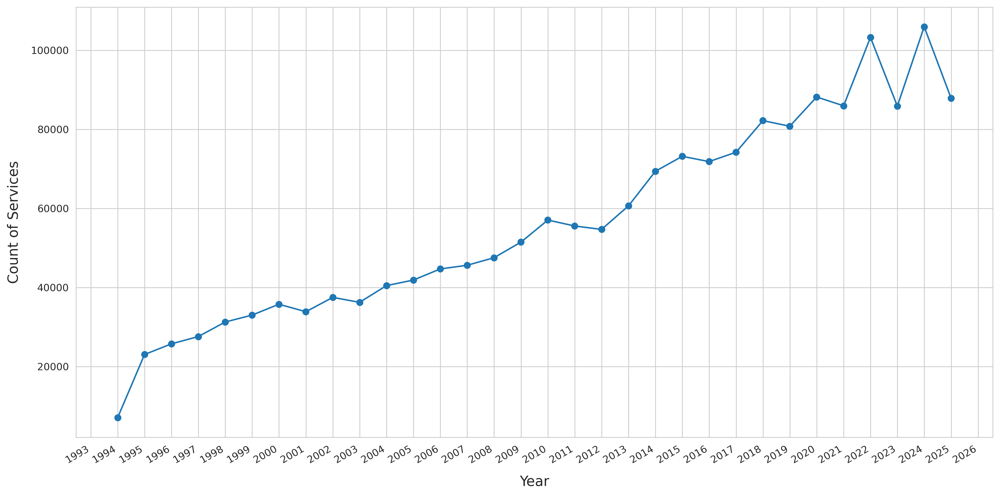

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from pandas.plotting import register_matplotlib_converters

# Inline plotting for Jupyter
%matplotlib inline

register_matplotlib_converters()

# -- Load and prepare the data --
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Convert Month column to datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only the specific item categories
items_to_include = [
    '73287', '73289', '73292', '73298', '73299',
    '73358', '73359', '73360', '73395', '73401',
    '73402', '73422', '73425', '73426', '73442',
    '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)]

# Aggregate 'Value' by year across all items and states (using 'A' for annual)
annual_data = filtered_data['Value'].resample('A').sum()

# -- Plotting --
# Use Seaborn to set a clean style
sns.set_style('whitegrid')

# Create figure and axis
fig, ax = plt.subplots(figsize=(14, 7), dpi=300)  # higher DPI for better print quality

# Plot the resampled data
ax.plot(annual_data.index, annual_data, marker='o', linestyle='-', color='#1f77b4')

# Title and labels
# ax.set_title('Annual Sum of Value Over Time', fontsize=16, pad=15)
ax.set_xlabel('Year', fontsize=14, labelpad=10)
ax.set_ylabel('Count of Services', fontsize=14, labelpad=10)

# Configure the x-axis to show one major tick per year
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Improve the layout and the angle of x-axis labels
fig.autofmt_xdate()

plt.tight_layout()

# Display inline in Jupyter Notebook
plt.show()

# -- Save the figure as an SVG --
fig.savefig("AnnualValuePlot.svg", format='svg', dpi=300)


#### Visualise Quarterly with Moving Average Trendline

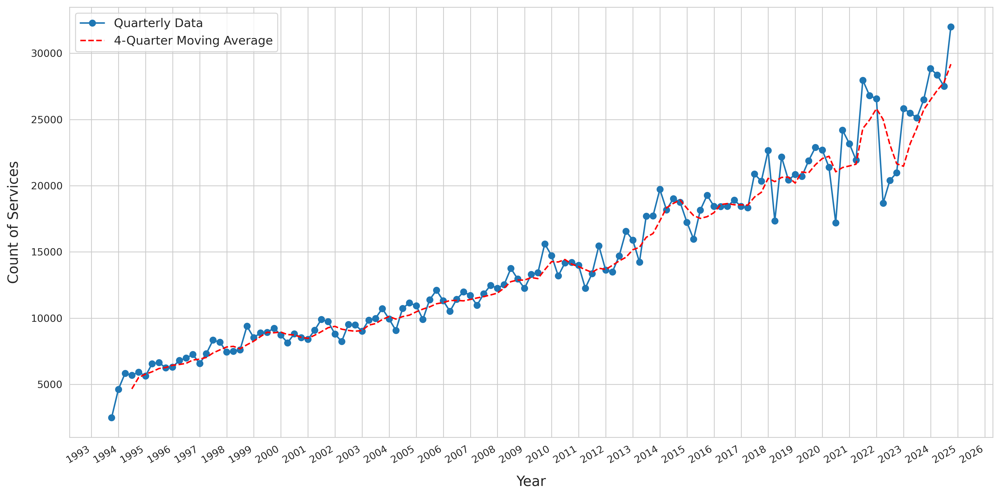

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from pandas.plotting import register_matplotlib_converters

# Inline plotting for Jupyter
%matplotlib inline

register_matplotlib_converters()

# -- Load and prepare the data --
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Convert Month column to datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only the specific item categories
items_to_include = [
    '73287', '73289', '73292', '73298', '73299',
    '73358', '73359', '73360', '73395', '73401',
    '73402', '73422', '73425', '73426', '73442',
    '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)]

# Aggregate 'Value' by quarter across all items and states (using 'QE' for quarter-end)
quarterly_data = filtered_data['Value'].resample('QE').sum()

# Calculate a 3-period moving average for the trendline
quarterly_trendline = quarterly_data.rolling(window=4).mean()

# -- Plotting --
# Use Seaborn to set a clean style
sns.set_style('whitegrid')

# Create figure and axis
fig, ax = plt.subplots(figsize=(14, 7), dpi=300)  # higher DPI for better print quality

# Plot the quarterly resampled data
ax.plot(quarterly_data.index, quarterly_data, marker='o', linestyle='-', color='#1f77b4', label='Quarterly Data')

# Add the 3-period moving average trendline
ax.plot(quarterly_trendline.index, quarterly_trendline, linestyle='--', color='red', label='4-Quarter Moving Average')

# Title and labels
ax.set_xlabel('Year', fontsize=14, labelpad=10)
ax.set_ylabel('Count of Services', fontsize=14, labelpad=10)

# Configure the x-axis to show one major tick per year and minor ticks each quarter
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_minor_locator(mdates.MonthLocator(bymonth=(1, 4, 7, 10)))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Add a legend
ax.legend(fontsize=12)

# Improve the layout and the angle of x-axis labels
fig.autofmt_xdate()

plt.tight_layout()

# Display inline in Jupyter Notebook
plt.show()

# -- Save the figure as an SVG --
fig.savefig("QuarterlyValueWithMovingAverageTrendline.svg", format='svg', dpi=300)


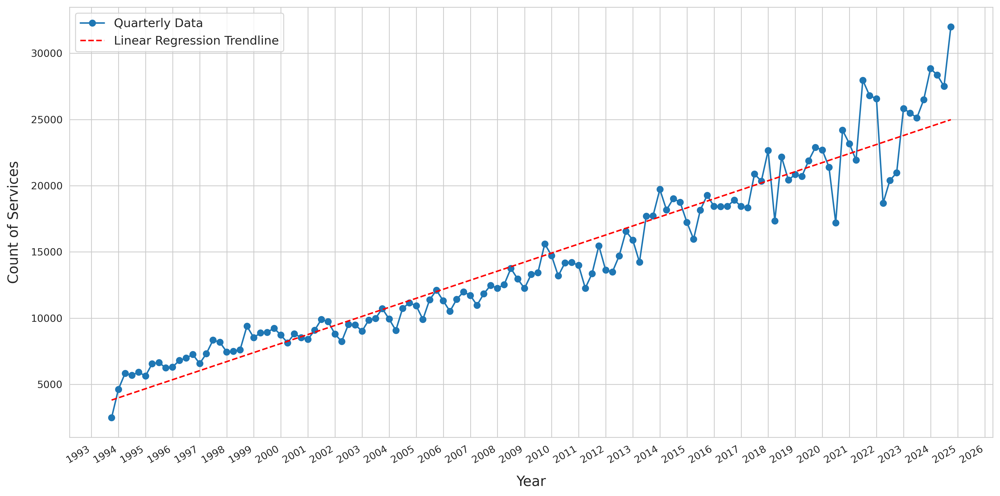

In [89]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from pandas.plotting import register_matplotlib_converters
from sklearn.linear_model import LinearRegression
import numpy as np

# Inline plotting for Jupyter
%matplotlib inline

register_matplotlib_converters()

# -- Load and prepare the data --
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Convert Month column to datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only the specific item categories
items_to_include = [
    '73287', '73289', '73292', '73298', '73299',
    '73358', '73359', '73360', '73395', '73401',
    '73402', '73422', '73425', '73426', '73442',
    '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)]

# Aggregate 'Value' by quarter across all items and states (using 'QE' for quarter-end)
quarterly_data = filtered_data['Value'].resample('QE').sum()

# Prepare data for linear regression model
X = np.arange(len(quarterly_data)).reshape(-1, 1)  # Sequential numbers for each time period
y = quarterly_data.values  # Actual values

# Fit the linear regression model
model = LinearRegression()
model.fit(X, y)
trendline = model.predict(X)

# -- Plotting --
# Use Seaborn to set a clean style
sns.set_style('whitegrid')

# Create figure and axis
fig, ax = plt.subplots(figsize=(14, 7), dpi=300)  # higher DPI for better print quality

# Plot the quarterly resampled data
ax.plot(quarterly_data.index, quarterly_data, marker='o', linestyle='-', color='#1f77b4', label='Quarterly Data')

# Add the linear regression trendline
ax.plot(quarterly_data.index, trendline, linestyle='--', color='red', label='Linear Regression Trendline')

# Title and labels
ax.set_xlabel('Year', fontsize=14, labelpad=10)
ax.set_ylabel('Count of Services', fontsize=14, labelpad=10)

# Configure the x-axis to show one major tick per year and minor ticks each quarter
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_minor_locator(mdates.MonthLocator(bymonth=(1, 4, 7, 10)))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Add a legend
ax.legend(fontsize=12)

# Improve the layout and the angle of x-axis labels
fig.autofmt_xdate()

plt.tight_layout()

# Display inline in Jupyter Notebook
plt.show()

# -- Save the figure as an SVG --
fig.savefig("QuarterlyValueWithLinearRegressionTrendline.svg", format='svg', dpi=300)


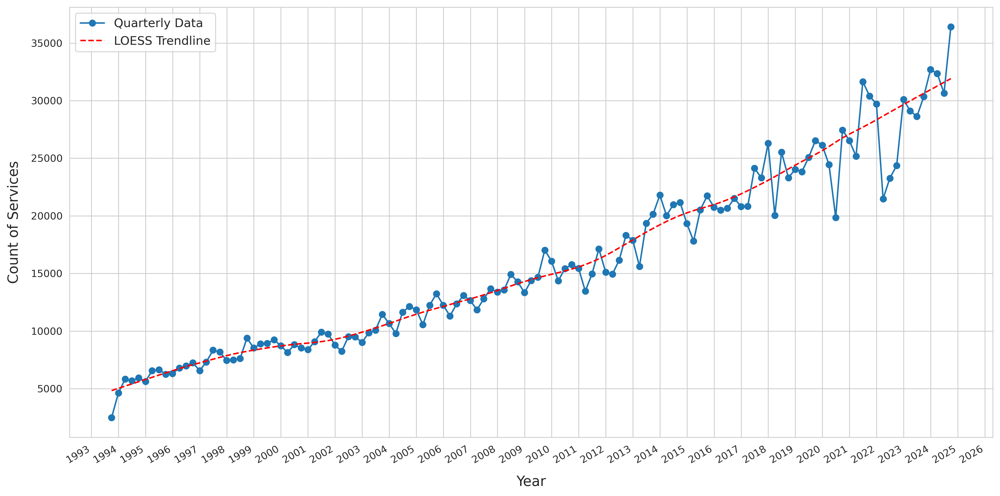

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from pandas.plotting import register_matplotlib_converters
from statsmodels.nonparametric.smoothers_lowess import lowess
import numpy as np

# Inline plotting for Jupyter
%matplotlib inline

register_matplotlib_converters()

# -- Load and prepare the data --
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Convert Month column to datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only the specific item categories
items_to_include = [
    '73287', '73289', '73292', '73298', '73299', '73300',
    '73358', '73359', '73360', '73395', '73401',
    '73402', '73422', '73425', '73426', '73442',
    '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)]

# Aggregate 'Value' by quarter across all items and states (using 'QE' for quarter-end)
quarterly_data = filtered_data['Value'].resample('QE').sum()

# Prepare data for LOESS
X = np.arange(len(quarterly_data))  # Sequential index values
y = quarterly_data.values

# Apply LOESS smoothing
loess_result = lowess(y, X, frac=0.2)  # frac controls smoothness; smaller values = less smooth
smoothed_values = loess_result[:, 1]

# -- Plotting --
# Use Seaborn to set a clean style
sns.set_style('whitegrid')

# Create figure and axis
fig, ax = plt.subplots(figsize=(14, 7), dpi=300)  # Higher DPI for better print quality

# Plot the quarterly resampled data
ax.plot(quarterly_data.index, quarterly_data, marker='o', linestyle='-', color='#1f77b4', label='Quarterly Data')

# Plot the LOESS smoothed trendline
ax.plot(quarterly_data.index, smoothed_values, linestyle='--', color='red', label='LOESS Trendline')

# Title and labels
ax.set_xlabel('Year', fontsize=14, labelpad=10)
ax.set_ylabel('Count of Services', fontsize=14, labelpad=10)

# Configure the x-axis to show one major tick per year and minor ticks each quarter
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_minor_locator(mdates.MonthLocator(bymonth=(1, 4, 7, 10)))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Add a legend
ax.legend(fontsize=12)

# Improve the layout and the angle of x-axis labels
fig.autofmt_xdate()

plt.tight_layout()

# Display inline in Jupyter Notebook
plt.show()

# -- Save the figure as an SVG --
fig.savefig("QuarterlyValueWithLOESSTrendline.svg", format='svg', dpi=300)


#### Table of Overall Utilisation (Annual)

In [36]:
import pandas as pd

# -- Load and prepare the data --
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Convert Month column to datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only the specific item categories
items_to_include = [
    '73287', '73289', '73292', '73298', '73299',
    '73358', '73359', '73360', '73395', '73401',
    '73402', '73422', '73425', '73426', '73442',
    '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)]

# Aggregate 'Value' by year (using 'YE' for year-end frequency)
annual_data = filtered_data['Value'].resample('YE').sum()

# Ensure the year is displayed correctly (only the year)
annual_data.index = annual_data.index.year

# Reverse the data for backward year calculation
annual_data = annual_data[::-1]

# Add reverse year index
reverse_years = range(1, len(annual_data) + 1)

# Convert to a DataFrame and add the reverse year index
annual_data_table = annual_data.reset_index()
annual_data_table.columns = ['Actual Year', 'Annual Count of Services']  # Explicitly rename columns
annual_data_table['Reverse Year'] = reverse_years
annual_data_table['Annual Count of Services'] = annual_data_table['Annual Count of Services'].astype(int)

# Reorder columns for clarity
annual_data_table = annual_data_table[['Reverse Year', 'Actual Year', 'Annual Count of Services']]

# Display the table
print(annual_data_table)


    Reverse Year  Actual Year  Annual Count of Services
0              1         2024                     87859
1              2         2023                    105961
2              3         2022                     85888
3              4         2021                    103280
4              5         2020                     85969
5              6         2019                     88201
6              7         2018                     80804
7              8         2017                     82221
8              9         2016                     74231
9             10         2015                     71862
10            11         2014                     73198
11            12         2013                     69399
12            13         2012                     60663
13            14         2011                     54720
14            15         2010                     55577
15            16         2009                     57077
16            17         2008                   

### By Test, Rare Disease

#### Visualise Quarterly

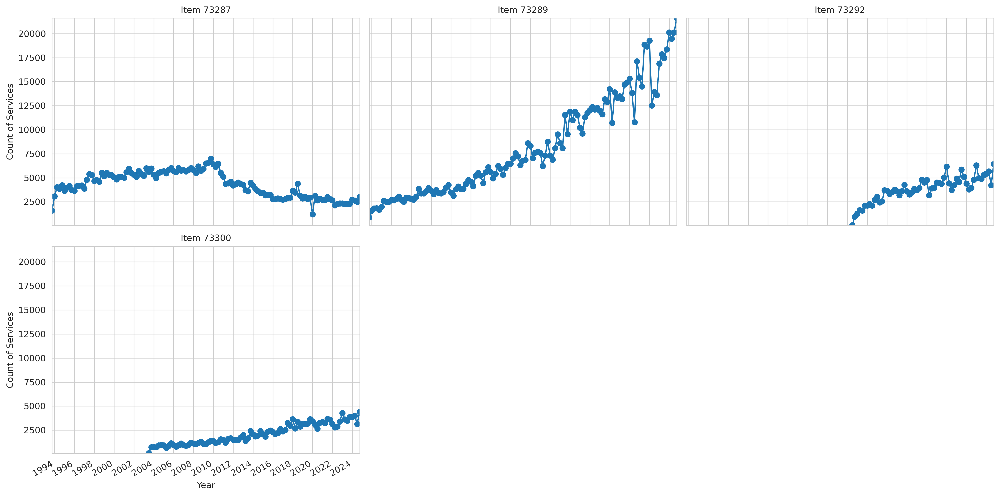

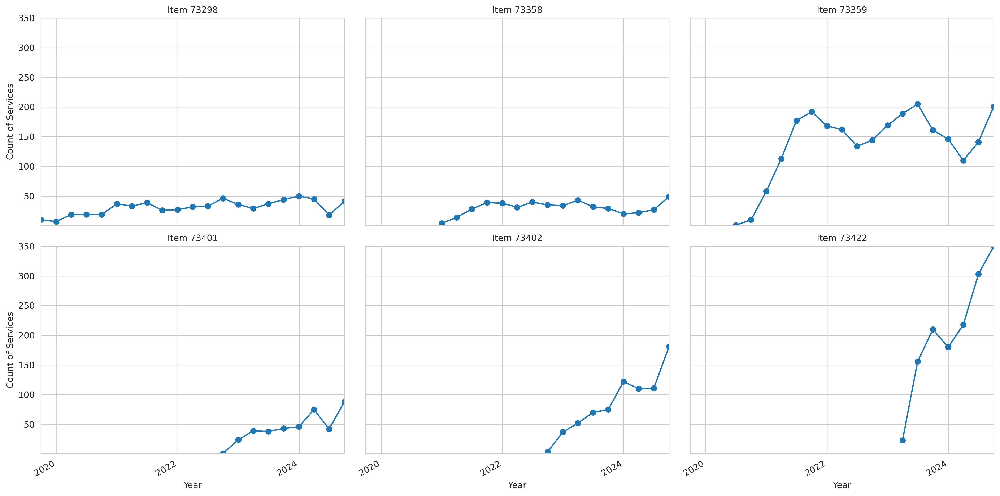

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from pandas.plotting import register_matplotlib_converters
import math

# Inline plotting for Jupyter
%matplotlib inline

register_matplotlib_converters()

# -- Load and prepare the data --
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Convert Month column to datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only the specific item categories
items_to_include = [
    '73287', '73289', '73292', '73298', '73299', '73300',
    '73358', '73359', '73360', '73395', '73401',
    '73402', '73422', '73425', '73426', '73442',
    '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)]

# Identify primary and secondary items
primary_items = ['73287', '73289', '73292', '73300']
secondary_items = [item for item in items_to_include if item not in primary_items]

# Aggregate 'Value' by quarter for each item
grouped_data = filtered_data.groupby('Item')['Value'].resample('QE').sum()

# Filter for items that exist in the grouped data
available_primary_items = [item for item in primary_items if item in grouped_data.index.get_level_values('Item')]
available_secondary_items = [item for item in secondary_items if item in grouped_data.index.get_level_values('Item')]

# Function to create subplots for a given set of items
def create_subplots(items, x_range=None, filename=None):
    num_items = len(items)
    cols = 3  # Set to 3 columns
    rows = math.ceil(num_items / cols)

    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(16, 4 * rows), dpi=300, sharex=True, sharey=True)
    axes = axes.flatten() if num_items > 1 else [axes]  # Flatten axes for easy iteration

    y_min, y_max = grouped_data.loc[items].min(), grouped_data.loc[items].max()

    for ax, item in zip(axes, items):
        item_data = grouped_data.loc[item]
        ax.plot(item_data.index, item_data, marker='o', linestyle='-', label=f'Item {item}')
        if x_range:
            ax.set_xlim(x_range)
        ax.set_ylim(y_min, y_max)
        ax.set_title(f'Item {item}', fontsize=10)

    # Hide unused subplots
    for ax in axes[len(items):]:
        ax.axis('off')

    # Configure x-axis and y-axis labels
    for ax in axes[-cols:]:  # Last row
        ax.set_xlabel('Year', fontsize=10)
    for ax in axes[::cols]:  # First column
        ax.set_ylabel('Count of Services', fontsize=10)

    # Configure x-axis ticks
    for ax in axes:
        ax.xaxis.set_major_locator(mdates.YearLocator(base=2))  # Show every 2nd year
        ax.xaxis.set_minor_locator(mdates.MonthLocator(bymonth=(1, 7)))  # Minor ticks for January and July
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

    # Improve layout
    fig.autofmt_xdate()
    plt.tight_layout()

    # Display the plot
    plt.show()

    # Save the figure
    if filename:
        fig.savefig(filename, format='svg', dpi=300)

# Determine x-axis ranges for each plot
primary_x_range = (
    grouped_data.loc[available_primary_items].index.get_level_values('Month').min(),
    grouped_data.loc[available_primary_items].index.get_level_values('Month').max(),
)

secondary_x_range = (
    grouped_data.loc[available_secondary_items].index.get_level_values('Month').min(),
    grouped_data.loc[available_secondary_items].index.get_level_values('Month').max(),
)

# Create plots for primary and secondary items
create_subplots(
    available_primary_items,
    x_range=primary_x_range,
    filename="PrimaryAxisItems_3cols.svg"
)

create_subplots(
    available_secondary_items,
    x_range=secondary_x_range,
    filename="SecondaryAxisItems_3cols.svg"
)


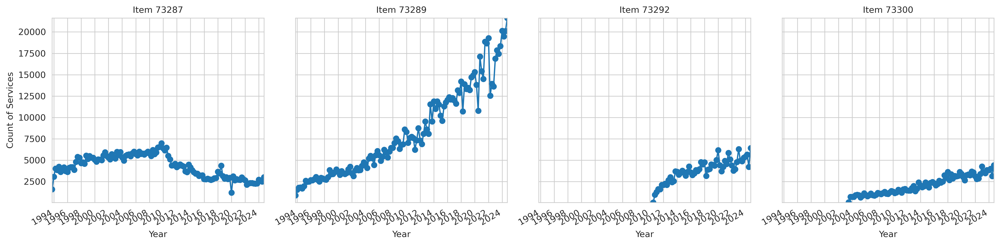

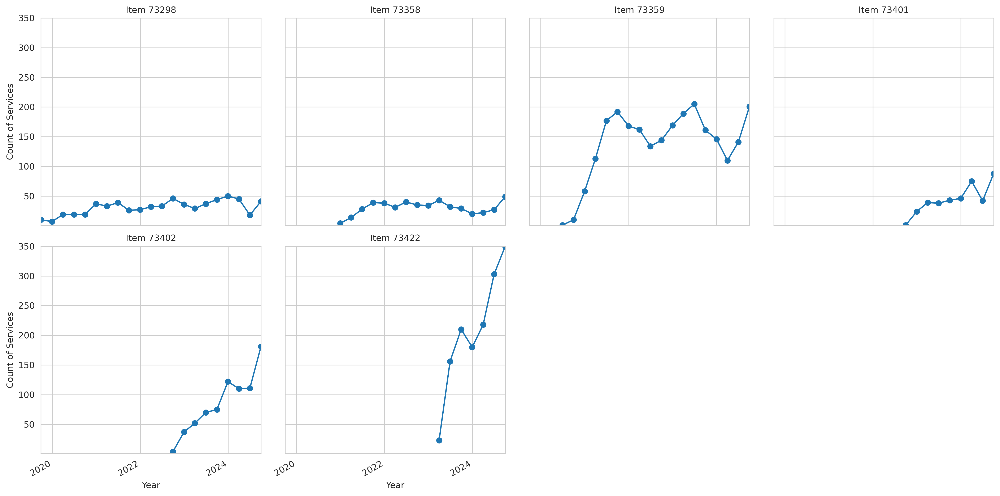

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from pandas.plotting import register_matplotlib_converters
import math

# Inline plotting for Jupyter
%matplotlib inline

register_matplotlib_converters()

# -- Load and prepare the data --
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Convert Month column to datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only the specific item categories
items_to_include = [
    '73287', '73289', '73292', '73298', '73299', '73300',
    '73358', '73359', '73360', '73395', '73401',
    '73402', '73422', '73425', '73426', '73442',
    '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)]

# Identify primary and secondary items
primary_items = ['73287', '73289', '73292', '73300']
secondary_items = [item for item in items_to_include if item not in primary_items]

# Aggregate 'Value' by quarter for each item
grouped_data = filtered_data.groupby('Item')['Value'].resample('QE').sum()

# Filter for items that exist in the grouped data
available_primary_items = [item for item in primary_items if item in grouped_data.index.get_level_values('Item')]
available_secondary_items = [item for item in secondary_items if item in grouped_data.index.get_level_values('Item')]

# Function to create subplots for a given set of items
def create_subplots(items, x_range=None, filename=None):
    num_items = len(items)
    cols = 4  # Set to 4 columns
    rows = math.ceil(num_items / cols)

    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(16, 4 * rows), dpi=300, sharex=True, sharey=True)
    axes = axes.flatten() if num_items > 1 else [axes]  # Flatten axes for easy iteration

    y_min, y_max = grouped_data.loc[items].min(), grouped_data.loc[items].max()

    for ax, item in zip(axes, items):
        item_data = grouped_data.loc[item]
        ax.plot(item_data.index, item_data, marker='o', linestyle='-', label=f'Item {item}')
        if x_range:
            ax.set_xlim(x_range)
        ax.set_ylim(y_min, y_max)
        ax.set_title(f'Item {item}', fontsize=10)

    # Hide unused subplots
    for ax in axes[len(items):]:
        ax.axis('off')

    # Configure x-axis and y-axis labels
    for ax in axes[-cols:]:  # Last row
        ax.set_xlabel('Year', fontsize=10)
    for ax in axes[::cols]:  # First column
        ax.set_ylabel('Count of Services', fontsize=10)

    # Configure x-axis ticks
    for ax in axes:
        ax.xaxis.set_major_locator(mdates.YearLocator(base=2))  # Show every 2nd year
        ax.xaxis.set_minor_locator(mdates.MonthLocator(bymonth=(1, 7)))  # Minor ticks for January and July
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

    # Improve layout
    fig.autofmt_xdate()
    plt.tight_layout()

    # Display the plot
    plt.show()

    # Save the figure
    if filename:
        fig.savefig(filename, format='svg', dpi=300)

# Determine x-axis ranges for each plot
primary_x_range = (
    grouped_data.loc[available_primary_items].index.get_level_values('Month').min(),
    grouped_data.loc[available_primary_items].index.get_level_values('Month').max(),
)

secondary_x_range = (
    grouped_data.loc[available_secondary_items].index.get_level_values('Month').min(),
    grouped_data.loc[available_secondary_items].index.get_level_values('Month').max(),
)

# Create plots for primary and secondary items
create_subplots(
    available_primary_items,
    x_range=primary_x_range,
    filename="PrimaryAxisItems_4cols.svg"
)

create_subplots(
    available_secondary_items,
    x_range=secondary_x_range,
    filename="SecondaryAxisItems_4cols.svg"
)


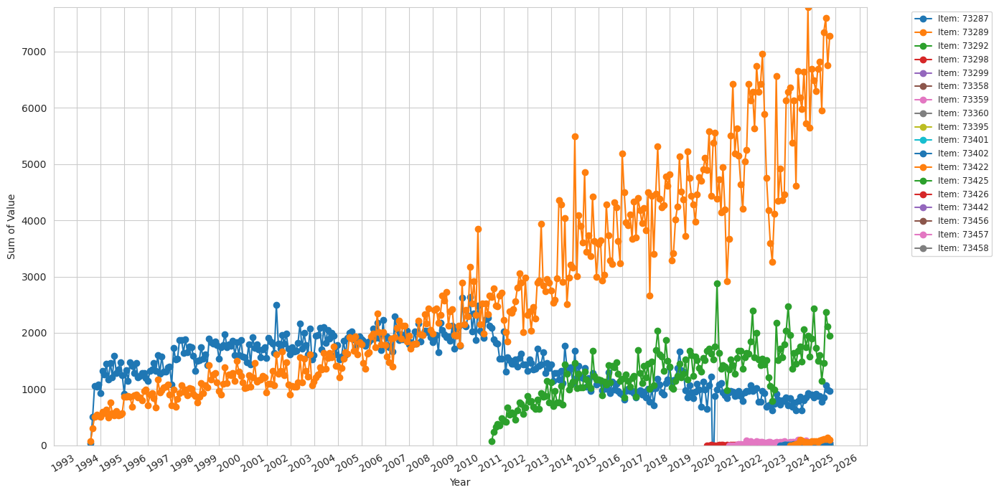

Plot saved as: MonthlySum_SelectedItems.svg


In [81]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from pandas.plotting import register_matplotlib_converters

register_matplotlib_converters()

# Load the data
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Strip whitespace from the "Item" column
data['Item'] = data['Item'].astype(str).str.strip()

# Ensure the "Month" column is treated as datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only specific "Item" categories
items_to_include = [
    '73287', '73289', '73292', '73298', '73299',
    '73358', '73359', '73360', '73395', '73401',
    '73402', '73422', '73425', '73426', '73442',
    '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)]

# Calculate the global y-axis maximum based on the highest peak after resampling
y_max = filtered_data.groupby('Item')['Value'].resample('ME').sum().max()
y_min = 0  # Assuming y-axis starts at 0 for better comparison

# Plotting all items on the same plot
plt.figure(figsize=(14, 7))

# Plot each item
for item in items_to_include:
    item_data = filtered_data[filtered_data['Item'] == item]['Value'].resample('ME').sum()
    plt.plot(item_data.index, item_data, marker='o', linestyle='-', label=f'Item: {item}')

# Setting title and labels
#plt.title('Monthly Sum of Value Over Time for Selected Items')
plt.xlabel('Year')
plt.ylabel('Sum of Value')
plt.ylim([y_min, y_max])

# Set x-axis major locator to every year and minor locator to every quarter
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_minor_locator(mdates.MonthLocator(bymonth=(1, 4, 7, 10)))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Improve display of x-axis labels
plt.gcf().autofmt_xdate()

# Show legend
plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1), fontsize='small')

# Tight layout to avoid clipping
plt.tight_layout()

# Save the figure as SVG
output_file = "MonthlySum_SelectedItems.svg"
plt.savefig(output_file, format='svg', dpi=300)

# Show the plot
plt.show()

print(f"Plot saved as: {output_file}")


/tmp/ipykernel_950/1196166604.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Item'] = filtered_data['Item'].apply(lambda x: x if x in items_to_keep else 'Group')


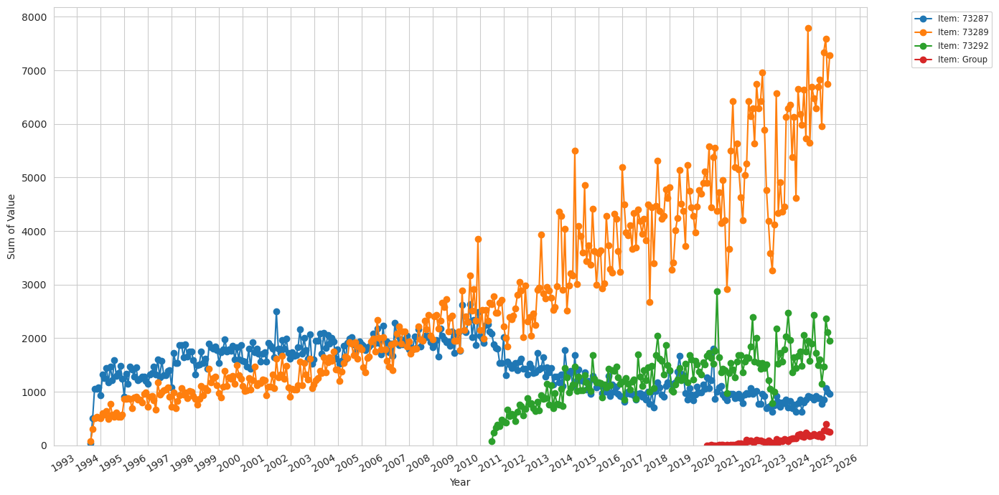

Plot saved as: MonthlySum_GroupedItems.svg


In [86]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from pandas.plotting import register_matplotlib_converters

register_matplotlib_converters()

# Load the data
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Strip whitespace from the "Item" column
data['Item'] = data['Item'].astype(str).str.strip()

# Ensure the "Month" column is treated as datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Convert the "Value" column to absolute values
data['Value'] = data['Value'].abs()

# Filter the data to include only specific "Item" categories
items_to_include = [
    '73287', '73289', '73292', '73298', '73299',
    '73358', '73359', '73360', '73395', '73401',
    '73402', '73422', '73425', '73426', '73442',
    '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)]

# Rename the "Item" column values
items_to_keep = ['73287', '73289', '73292']
filtered_data['Item'] = filtered_data['Item'].apply(lambda x: x if x in items_to_keep else 'Group')

# Plotting all items on the same plot
plt.figure(figsize=(14, 7))

# Plot each unique item/group
for item in filtered_data['Item'].unique():
    item_data = filtered_data[filtered_data['Item'] == item]['Value'].resample('ME').sum()
    plt.plot(item_data.index, item_data, marker='o', linestyle='-', label=f'Item: {item}')

# Setting title and labels
#plt.title('Monthly Sum of Value Over Time for Selected Items')
plt.xlabel('Year')
plt.ylabel('Sum of Value')

# Set y-axis to start at 0
plt.ylim(bottom=0)

# Set x-axis major locator to every year and minor locator to every quarter
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_minor_locator(mdates.MonthLocator(bymonth=(1, 4, 7, 10)))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Improve display of x-axis labels
plt.gcf().autofmt_xdate()

# Show legend
plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1), fontsize='small')

plt.tight_layout()

# Save the figure as SVG
output_file = "MonthlySum_GroupedItems.svg"
plt.savefig(output_file, format='svg', dpi=300)

# Show the plot
plt.show()

print(f"Plot saved as: {output_file}")


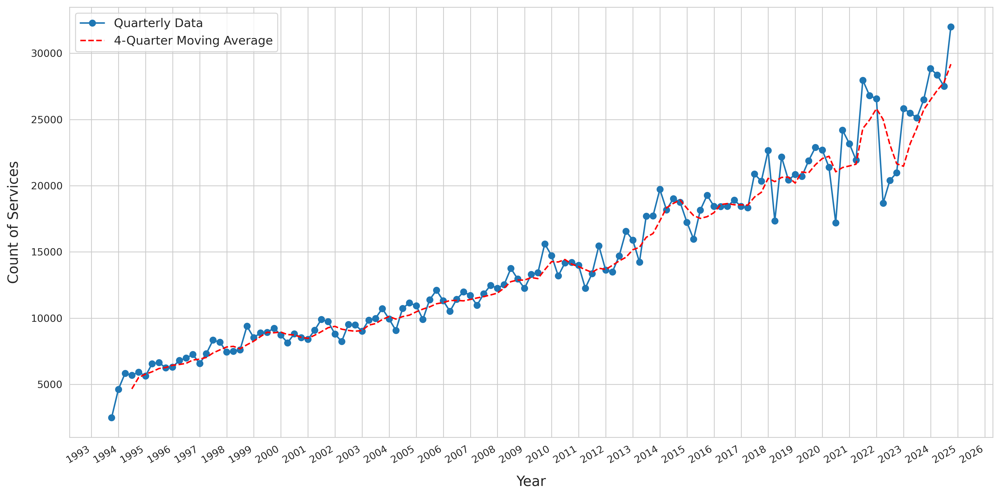

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from pandas.plotting import register_matplotlib_converters

# Inline plotting for Jupyter
%matplotlib inline

register_matplotlib_converters()

# -- Load and prepare the data --
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Convert Month column to datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only the specific item categories
items_to_include = [
    '73287', '73289', '73292', '73298', '73299',
    '73358', '73359', '73360', '73395', '73401',
    '73402', '73422', '73425', '73426', '73442',
    '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)]

# Aggregate 'Value' by quarter across all items and states (using 'QE' for quarter-end)
quarterly_data = filtered_data['Value'].resample('QE').sum()

# Calculate a 3-period moving average for the trendline
quarterly_trendline = quarterly_data.rolling(window=4).mean()

# -- Plotting --
# Use Seaborn to set a clean style
sns.set_style('whitegrid')

# Create figure and axis
fig, ax = plt.subplots(figsize=(14, 7), dpi=300)  # higher DPI for better print quality

# Plot the quarterly resampled data
ax.plot(quarterly_data.index, quarterly_data, marker='o', linestyle='-', color='#1f77b4', label='Quarterly Data')

# Add the 3-period moving average trendline
ax.plot(quarterly_trendline.index, quarterly_trendline, linestyle='--', color='red', label='4-Quarter Moving Average')

# Title and labels
ax.set_xlabel('Year', fontsize=14, labelpad=10)
ax.set_ylabel('Count of Services', fontsize=14, labelpad=10)

# Configure the x-axis to show one major tick per year and minor ticks each quarter
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_minor_locator(mdates.MonthLocator(bymonth=(1, 4, 7, 10)))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Add a legend
ax.legend(fontsize=12)

# Improve the layout and the angle of x-axis labels
fig.autofmt_xdate()

plt.tight_layout()

# Display inline in Jupyter Notebook
plt.show()

# -- Save the figure as an SVG --
fig.savefig("QuarterlyValueWithMovingAverageTrendline.svg", format='svg', dpi=300)


#### Table of Overall Utilisation (Annual)

In [74]:
import pandas as pd

# -- Load and prepare the data --
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Convert Month column to datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only the specific item categories
items_to_include = [
    '73287', '73289', '73292', '73298', '73299',
    '73358', '73359', '73360', '73395', '73401',
    '73402', '73422', '73425', '73426', '73442',
    '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)]

# Aggregate 'Value' by year (using 'YE' for year-end frequency)
annual_data = filtered_data.groupby('Item')['Value'].resample('YE').sum()

# Pivot the data to have a column for each category
annual_data_table = annual_data.reset_index().pivot(index='Month', columns='Item', values='Value')

# Reverse the order of years
annual_data_table = annual_data_table.iloc[::-1]

# Add the reverse year index and rename the columns
reverse_years = range(1, len(annual_data_table) + 1)
annual_data_table['Reverse Year'] = reverse_years
annual_data_table['Actual Year'] = annual_data_table.index.year

# Reorder columns to have year-related columns first
annual_data_table.reset_index(drop=True, inplace=True)
annual_data_table = annual_data_table[['Reverse Year', 'Actual Year'] + [col for col in annual_data_table.columns if col not in ['Reverse Year', 'Actual Year']]]

# Replace NaN with zeros and ensure all values are integers
annual_data_table.fillna(0, inplace=True)
annual_data_table = annual_data_table.astype(int)


#### Table of Overall Utilisation (Annual) - Groupings

In [4]:
import pandas as pd

# -- Load and prepare the data --
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Convert Month column to datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only the specific item categories
items_to_include = [
    '73287', '73289', '73292', '73298', '73299',
    '73300',  # Added "73300"
    '73358', '73359', '73360', '73395', '73401',
    '73402', '73422', '73425', '73426', '73442',
    '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)]

# Aggregate 'Value' by year (using 'YE' for year-end frequency)
annual_data = filtered_data.groupby('Item')['Value'].resample('YE').sum()

# Pivot the data to have a column for each category
annual_data_table = annual_data.reset_index().pivot(index='Month', columns='Item', values='Value')

# Reverse the order of years
annual_data_table = annual_data_table.iloc[::-1]

# Add the reverse year index and rename the columns
reverse_years = range(1, len(annual_data_table) + 1)
annual_data_table['Reverse Year'] = reverse_years
annual_data_table['Actual Year'] = annual_data_table.index.year

# Reorder columns to have year-related columns first
annual_data_table.reset_index(drop=True, inplace=True)
annual_data_table = annual_data_table[['Reverse Year', 'Actual Year'] + [col for col in annual_data_table.columns if col not in ['Reverse Year', 'Actual Year']]]

# Replace NaN with zeros and ensure all values are integers
annual_data_table.fillna(0, inplace=True)
annual_data_table = annual_data_table.astype(int)

# Create new aggregate columns for Kidney and CS groups
annual_data_table['Kidney'] = annual_data_table[['73298', '73401', '73402']].sum(axis=1)
annual_data_table['CS'] = annual_data_table[['73358', '73359']].sum(axis=1)

# Optionally, drop the original columns if they are no longer needed
annual_data_table.drop(columns=['73298', '73401', '73402', '73358', '73359'], inplace=True)


In [5]:
print(annual_data_table)

Item  Reverse Year  Actual Year  73287  73289  73292  73300  73422  Kidney  \
0                1         2024   8200  61213  16314  11550    871     711   
1                2         2023   9566  73785  20571  14825    569     645   
2                3         2022   9102  56974  18850  13331      0     213   
3                4         2021  11159  71287  19940  13664      0     125   
4                5         2020  11341  57149  17312  12315      0      94   
5                6         2019   9983  58146  20055  13358      0      17   
6                7         2018  13843  51403  15558  12101      0       0   
7                8         2017  12308  51885  18028  12347      0       0   
8                9         2016  11150  48766  14315   9272      0       0   
9               10         2015  12436  44735  14691   8963      0       0   
10              11         2014  14358  44635  14205   8289      0       0   
11              12         2013  15988  41048  12363   7514     

In [6]:
annual_data_table

Item,Reverse Year,Actual Year,73287,73289,73292,73300,73422,Kidney,CS
0,1,2024,8200,61213,16314,11550,871,711,550
1,2,2023,9566,73785,20571,14825,569,645,825
2,3,2022,9102,56974,18850,13331,0,213,749
3,4,2021,11159,71287,19940,13664,0,125,769
4,5,2020,11341,57149,17312,12315,0,94,73
5,6,2019,9983,58146,20055,13358,0,17,0
6,7,2018,13843,51403,15558,12101,0,0,0
7,8,2017,12308,51885,18028,12347,0,0,0
8,9,2016,11150,48766,14315,9272,0,0,0
9,10,2015,12436,44735,14691,8963,0,0,0


## Shape Age-Gender Data

In [ ]:
from bs4 import BeautifulSoup
import pandas as pd
from io import StringIO
import glob
import os
import re

# Define the folder containing the HTML files
folder_path = '/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBS Files/Services Data - Age Gender - 202411'

# Initialize an empty list to store DataFrames
all_dataframes = []

# Define the expected columns for consistency
expected_columns = ['Gender', 'Age Range', 'Month', 'NSW', 'VIC', 'QLD', 'SA', 'WA', 'TAS', 'ACT', 'NT', 'Total']

# Loop through each HTML file in the folder
for file_path in glob.glob(os.path.join(folder_path, '*.html')):
    with open(file_path, 'r', encoding='utf-8') as file:
        soup = BeautifulSoup(file, 'html.parser')

        # Extract the table if present
        table = soup.find("table")
        if table is None:
            print(f"No table found in {file_path}. Skipping this file.")
            continue

        # Parse the table into a DataFrame
        df = pd.read_html(StringIO(str(table)))[0]

        # Check if the number of columns matches the expected structure
        if len(df.columns) != len(expected_columns):
            print(f"Unexpected column count in {file_path}. Skipping this file.")
            continue

        # Clean up merged headers by replacing unnecessary repeated values and forward-filling
        df = df.replace(to_replace=r'Item \d+.*', value=None, regex=True).ffill(axis=0)

        # Rename columns
        df.columns = expected_columns

        # Identify unwanted categories in "Month" column
        unwanted_values = df['Month'].unique()

        # Filter out rows containing unwanted values in 'Gender', 'Age Range', and 'Month' columns
        df_cleaned = df[
            ~df['Month'].isin(['Total', 'Month']) & 
            ~df['Age Range'].isin(['Total', 'Unknown']) & 
            ~df['Age Range'].isin(unwanted_values) &
            ~df['Gender'].isin(unwanted_values)
        ].reset_index(drop=True)

        # Filter out rows in "Age Range" that are not in the allowed format (using regex)
        age_range_pattern = re.compile(r'^(0-4|5-14|15-24|25-34|35-44|45-54|55-64|65-74|75-84|>=85)$')
        df_cleaned = df_cleaned[df_cleaned['Age Range'].str.match(age_range_pattern)]

        # Reshape the DataFrame to the desired tidy format
        df_tidy = pd.melt(df_cleaned, 
                          id_vars=['Gender', 'Age Range', 'Month'], 
                          value_vars=['NSW', 'VIC', 'QLD', 'SA', 'WA', 'TAS', 'ACT', 'NT'],
                          var_name='State', 
                          value_name='Count')

        # Convert "Month" column from "MMMYYYY" to datetime format and then format as "month-year"
        df_tidy['Month'] = pd.to_datetime(df_tidy['Month'], format='%b%Y').dt.strftime('%B-%Y')

        # Append the tidy DataFrame to the list
        all_dataframes.append(df_tidy)

# Concatenate all DataFrames into one
final_df = pd.concat(all_dataframes, ignore_index=True)

# Save the concatenated DataFrame to both CSV and Feather formats
final_df.to_csv('P7_combined_tidy_medicare_data.csv', index=False)
final_df.to_feather('P7_combined_tidy_medicare_data.feather')


Unexpected column count in /mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBS Files/Services Data - Age Gender - 202411/Item_73287_Month_199307.html. Skipping this file.
Unexpected column count in /mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBS Files/Services Data - Age Gender - 202411/Item_73287_Month_201704.html. Skipping this file.
Unexpected column count in /mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBS Files/Services Data - Age Gender - 202411/Item_73287_Month_201707.html. Skipping this file.
Unexpected column count in /mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBS Files/Services Data - Age Gender - 202411/Item_73287_Month_201905.html. Skipping thi

## Diffusion Curves

/tmp/ipykernel_497/3432854202.py:67: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
/tmp/ipykernel_497/3432854202.py:33: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * np.exp(-c * t))
/tmp/ipykernel_497/3432854202.py:67: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
/tmp/ipykernel_497/3432854202.py:30: RuntimeWarning: overflow encountered in exp
  return K / (1 + np.exp(-r * (t - t0)))
/tmp/ipykernel_497/3432854202.py:33: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * np.exp(-c * t))
/tmp/ipykernel_497/3432854202.py:36: RuntimeWarning: overflow encountered in exp
  return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))
/tmp/ipykernel_497/3432854202.py:36: RuntimeWarning: invalid value encountered in divide
  return M * (1 - np.exp(-(

Item 73299 has no data after resampling. Skipping.


/tmp/ipykernel_497/3432854202.py:30: RuntimeWarning: overflow encountered in exp
  return K / (1 + np.exp(-r * (t - t0)))
/tmp/ipykernel_497/3432854202.py:67: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
/tmp/ipykernel_497/3432854202.py:33: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * np.exp(-c * t))
/tmp/ipykernel_497/3432854202.py:36: RuntimeWarning: overflow encountered in exp
  return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))
/tmp/ipykernel_497/3432854202.py:36: RuntimeWarning: invalid value encountered in divide
  return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))
/tmp/ipykernel_497/3432854202.py:36: RuntimeWarning: overflow encountered in multiply
  return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))
/home/doughnut/miniconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sa

Item 73360 has no data after resampling. Skipping.
Item 73395 has no data after resampling. Skipping.


/tmp/ipykernel_497/3432854202.py:30: RuntimeWarning: overflow encountered in exp
  return K / (1 + np.exp(-r * (t - t0)))
/tmp/ipykernel_497/3432854202.py:67: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
/tmp/ipykernel_497/3432854202.py:33: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * np.exp(-c * t))
/tmp/ipykernel_497/3432854202.py:36: RuntimeWarning: overflow encountered in exp
  return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))
/tmp/ipykernel_497/3432854202.py:36: RuntimeWarning: invalid value encountered in divide
  return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))
/home/doughnut/miniconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/ho

Item 73425 has no data after resampling. Skipping.
Item 73426 has no data after resampling. Skipping.
Item 73442 has no data after resampling. Skipping.
Item 73456 has no data after resampling. Skipping.
Item 73457 has no data after resampling. Skipping.
Item 73458 has no data after resampling. Skipping.


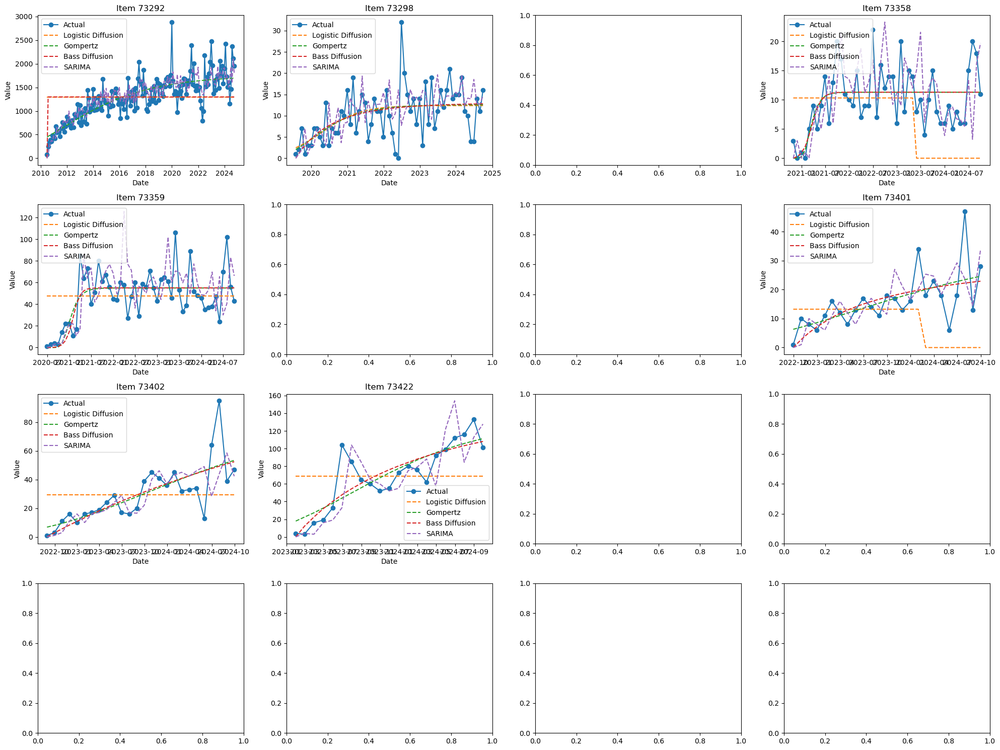

TypeError: DataFrame.pivot() takes 1 positional argument but 4 were given

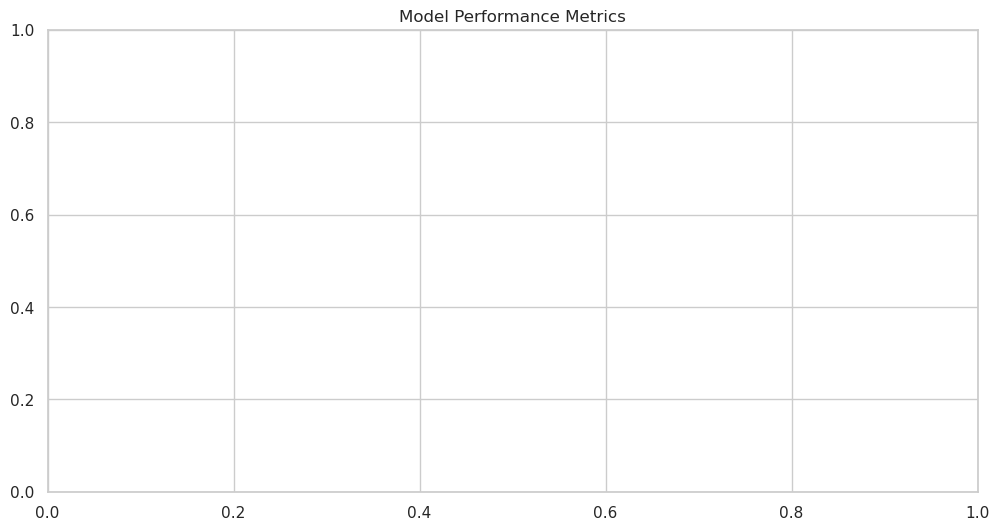

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score
import seaborn as sns

# Load the data (use your own path as needed)
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Strip whitespace from the "Item" column
data['Item'] = data['Item'].astype(str).str.strip()

# Ensure the "Month" column is treated as datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only specific "Item" categories
items_to_include = [
    '73292', '73298', '73299', '73358', '73359',
    '73360', '73395', '73401', '73402', '73422',
    '73425', '73426', '73442', '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)].copy()

# Define model functions
def logistic_diffusion(t, K, r, t0):
    return K / (1 + np.exp(-r * (t - t0)))

def gompertz(t, a, b, c):
    return a * np.exp(-b * np.exp(-c * t))

def bass_diffusion(t, p, q, M):
    return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))

# Initialize dictionaries for results
model_results = []

# Plot settings
n_items = len(items_to_include)
cols = 4
rows = int(np.ceil(n_items / cols))
fig, axes = plt.subplots(rows, cols, figsize=(20, 15))
axes = axes.flatten()

# Iterate through each item and fit models
for i, item in enumerate(items_to_include):
    item_data = filtered_data[filtered_data['Item'] == item]['Value'].resample('ME').sum().dropna()

    if item_data.empty:
        print(f"Item {item} has no data after resampling. Skipping.")
        continue

    time_index = np.arange(len(item_data))
    models = {
        "Logistic Diffusion": logistic_diffusion,
        "Gompertz": gompertz,
        "Bass Diffusion": bass_diffusion
    }

    results = {}

    for model_name, model_func in models.items():
        try:
            params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
            predicted = model_func(time_index, *params)
            r2 = r2_score(item_data, predicted)
            mae = mean_absolute_error(item_data, predicted)
            mape = mean_absolute_percentage_error(item_data, predicted)

            results[model_name] = {
                'r2': r2, 'MAE': mae, 'MAPE': mape, 'predicted': predicted
            }
        except Exception as e:
            print(f"Error fitting {model_name} for item {item}: {e}")

    # Fit SARIMA model
    try:
        sarima_model = SARIMAX(item_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        sarima_fit = sarima_model.fit(disp=False)
        sarima_pred = sarima_fit.fittedvalues
        sarima_r2 = r2_score(item_data, sarima_pred)
        sarima_mae = mean_absolute_error(item_data, sarima_pred)
        sarima_mape = mean_absolute_percentage_error(item_data, sarima_pred)

        results["SARIMA"] = {
            'r2': sarima_r2, 'MAE': sarima_mae, 'MAPE': sarima_mape, 'predicted': sarima_pred
        }
    except Exception as e:
        print(f"Error fitting SARIMA for item {item}: {e}")

    # Store results
    for model_name, metrics in results.items():
        model_results.append({
            'Item': item,
            'Model': model_name,
            'r2': metrics['r2'],
            'MAE': metrics['MAE'],
            'MAPE': metrics['MAPE']
        })

    # Plot the actual vs predicted values
    ax = axes[i]
    ax.plot(item_data.index, item_data, label='Actual', marker='o')
    for model_name, metrics in results.items():
        ax.plot(item_data.index, metrics['predicted'], label=model_name, linestyle='--')
    ax.set_title(f'Item {item}')
    ax.legend()
    ax.set_xlabel('Date')
    ax.set_ylabel('Value')

# Remove empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# Convert model results to DataFrame and display
results_df = pd.DataFrame(model_results)
sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
plt.title("Model Performance Metrics")
sns.heatmap(results_df.pivot("Item", "Model", "MAE"), annot=True, fmt=".2f", cmap="coolwarm")
plt.show()


/tmp/ipykernel_497/2956016419.py:72: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
/tmp/ipykernel_497/2956016419.py:38: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * np.exp(-c * t))
/tmp/ipykernel_497/2956016419.py:72: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
/tmp/ipykernel_497/2956016419.py:35: RuntimeWarning: overflow encountered in exp
  return K / (1 + np.exp(-r * (t - t0)))
/tmp/ipykernel_497/2956016419.py:38: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * np.exp(-c * t))
/tmp/ipykernel_497/2956016419.py:41: RuntimeWarning: overflow encountered in exp
  return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))
/tmp/ipykernel_497/2956016419.py:41: RuntimeWarning: invalid value encountered in divide
  return M * (1 - np.exp(-(

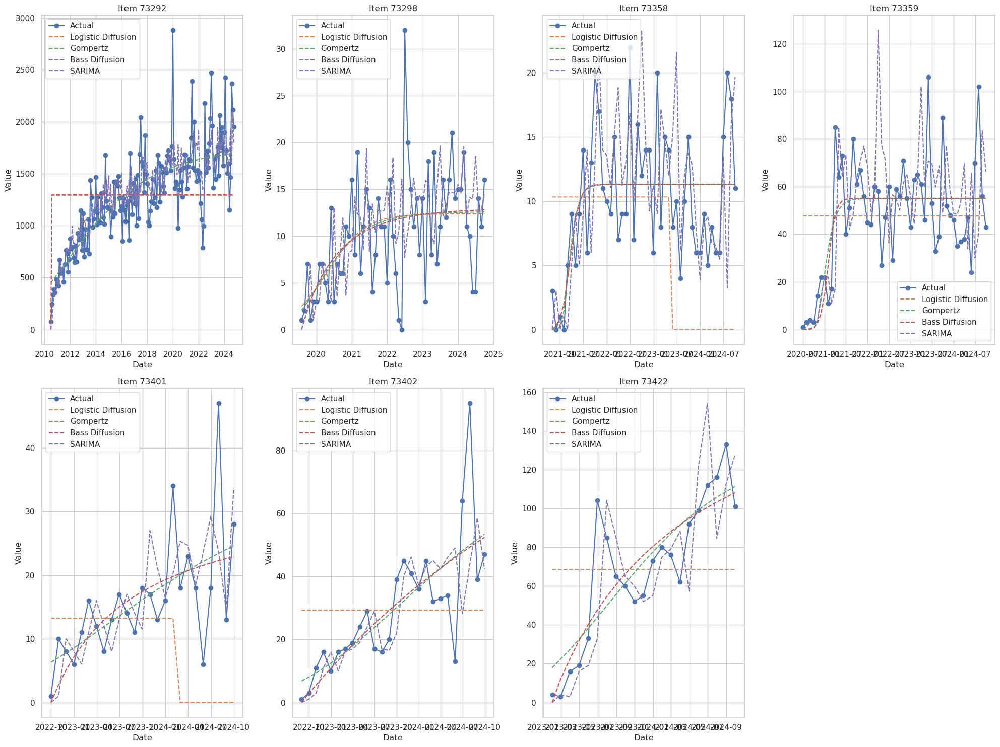

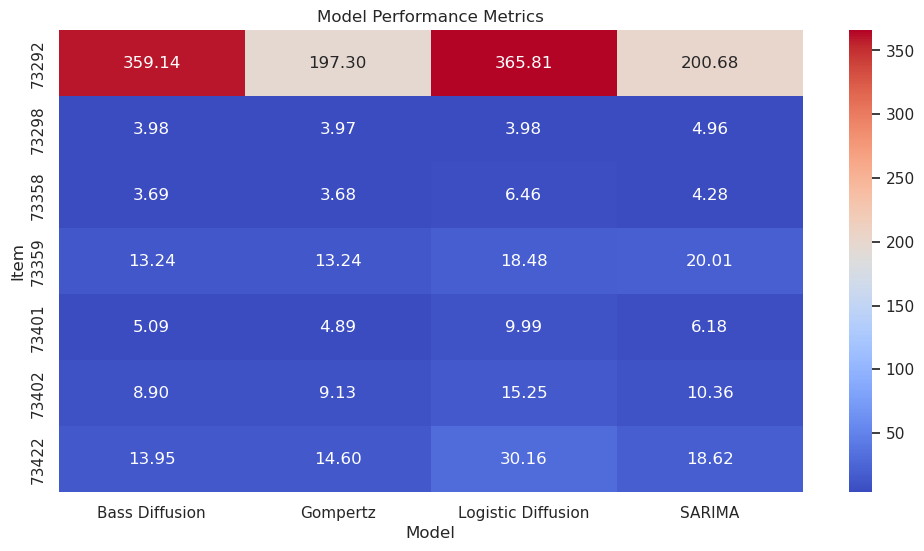

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score
import seaborn as sns

# Load the data (use your own path as needed)
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Strip whitespace from the "Item" column
data['Item'] = data['Item'].astype(str).str.strip()

# Ensure the "Month" column is treated as datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only specific "Item" categories
items_to_include = [
    '73292', '73298', '73299', '73358', '73359',
    '73360', '73395', '73401', '73402', '73422',
    '73425', '73426', '73442', '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)].copy()

# Drop categories with no data
data_counts = filtered_data.groupby('Item')['Value'].count()
valid_items = data_counts[data_counts > 0].index.tolist()
filtered_data = filtered_data[filtered_data['Item'].isin(valid_items)]

# Define model functions
def logistic_diffusion(t, K, r, t0):
    return K / (1 + np.exp(-r * (t - t0)))

def gompertz(t, a, b, c):
    return a * np.exp(-b * np.exp(-c * t))

def bass_diffusion(t, p, q, M):
    return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))

# Initialize dictionaries for results
model_results = []

# Plot settings
n_items = len(valid_items)
cols = 4
rows = int(np.ceil(n_items / cols))
fig, axes = plt.subplots(rows, cols, figsize=(20, 15))
axes = axes.flatten()

# Iterate through each item and fit models
for i, item in enumerate(valid_items):
    item_data = filtered_data[filtered_data['Item'] == item]['Value'].resample('ME').sum().dropna()

    if item_data.empty:
        print(f"Item {item} has no data after resampling. Skipping.")
        continue

    time_index = np.arange(len(item_data))
    models = {
        "Logistic Diffusion": logistic_diffusion,
        "Gompertz": gompertz,
        "Bass Diffusion": bass_diffusion
    }

    results = {}

    for model_name, model_func in models.items():
        try:
            params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
            predicted = model_func(time_index, *params)
            r2 = r2_score(item_data, predicted)
            mae = mean_absolute_error(item_data, predicted)
            mape = mean_absolute_percentage_error(item_data, predicted)

            results[model_name] = {
                'r2': r2, 'MAE': mae, 'MAPE': mape, 'predicted': predicted
            }
        except Exception as e:
            print(f"Error fitting {model_name} for item {item}: {e}")

    # Fit SARIMA model
    try:
        sarima_model = SARIMAX(item_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        sarima_fit = sarima_model.fit(disp=False)
        sarima_pred = sarima_fit.fittedvalues
        sarima_r2 = r2_score(item_data, sarima_pred)
        sarima_mae = mean_absolute_error(item_data, sarima_pred)
        sarima_mape = mean_absolute_percentage_error(item_data, sarima_pred)

        results["SARIMA"] = {
            'r2': sarima_r2, 'MAE': sarima_mae, 'MAPE': sarima_mape, 'predicted': sarima_pred
        }
    except Exception as e:
        print(f"Error fitting SARIMA for item {item}: {e}")

    # Store results
    for model_name, metrics in results.items():
        model_results.append({
            'Item': item,
            'Model': model_name,
            'r2': metrics['r2'],
            'MAE': metrics['MAE'],
            'MAPE': metrics['MAPE']
        })

    # Plot the actual vs predicted values
    ax = axes[i]
    ax.plot(item_data.index, item_data, label='Actual', marker='o')
    for model_name, metrics in results.items():
        ax.plot(item_data.index, metrics['predicted'], label=model_name, linestyle='--')
    ax.set_title(f'Item {item}')
    ax.legend()
    ax.set_xlabel('Date')
    ax.set_ylabel('Value')

# Remove empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# Convert model results to DataFrame and display
results_df = pd.DataFrame(model_results)
sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
plt.title("Model Performance Metrics")
results_pivot = results_df.pivot(index="Item", columns="Model", values="MAE")
sns.heatmap(results_pivot, annot=True, fmt=".2f", cmap="coolwarm")
plt.show()


/tmp/ipykernel_497/2590658812.py:72: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
/tmp/ipykernel_497/2590658812.py:38: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * np.exp(-c * t))
/tmp/ipykernel_497/2590658812.py:72: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
/tmp/ipykernel_497/2590658812.py:35: RuntimeWarning: overflow encountered in exp
  return K / (1 + np.exp(-r * (t - t0)))
/tmp/ipykernel_497/2590658812.py:38: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * np.exp(-c * t))
/tmp/ipykernel_497/2590658812.py:41: RuntimeWarning: overflow encountered in exp
  return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))
/tmp/ipykernel_497/2590658812.py:41: RuntimeWarning: invalid value encountered in divide
  return M * (1 - np.exp(-(

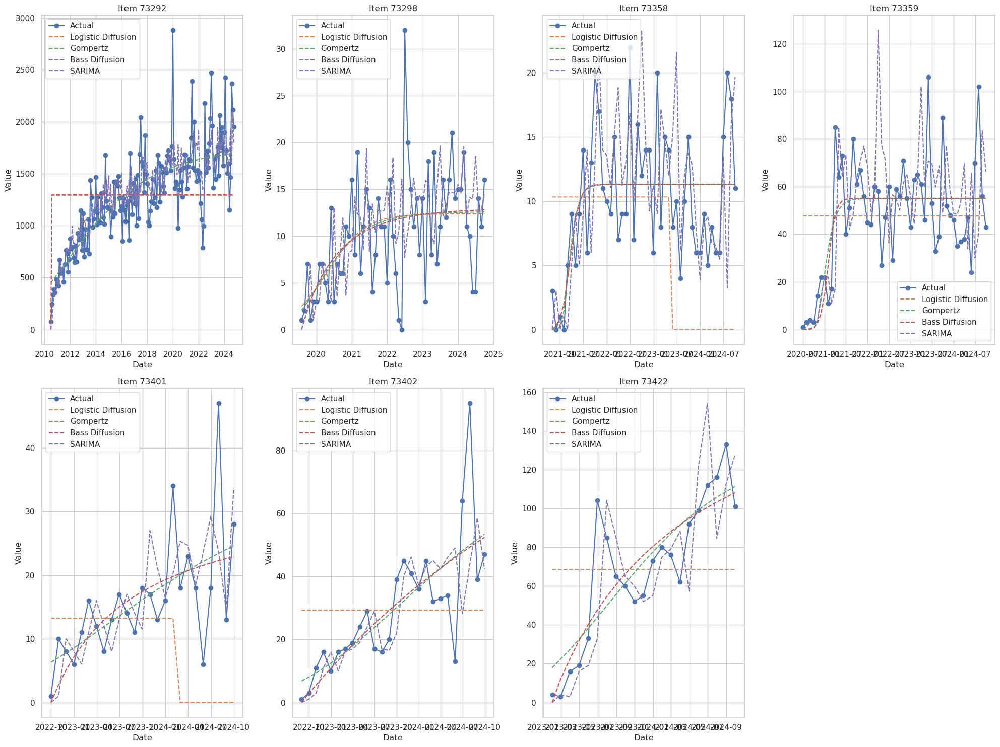

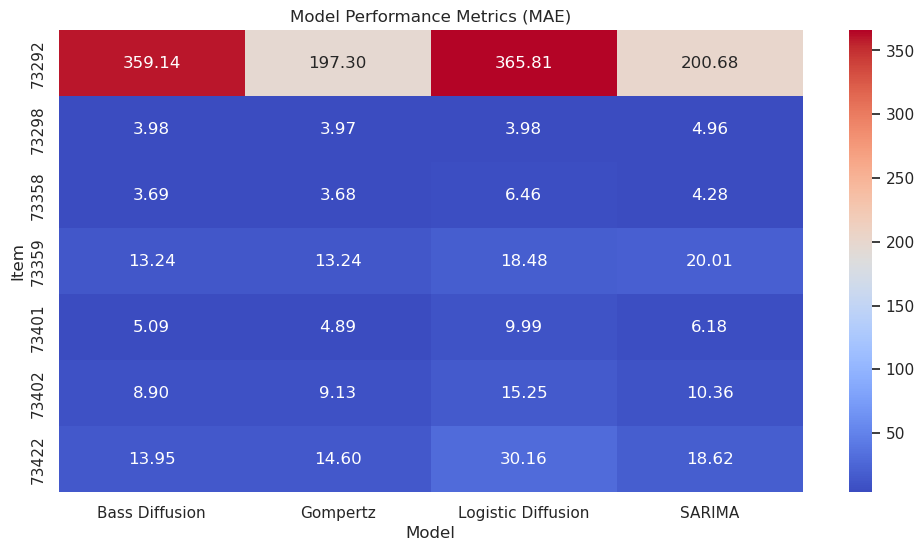

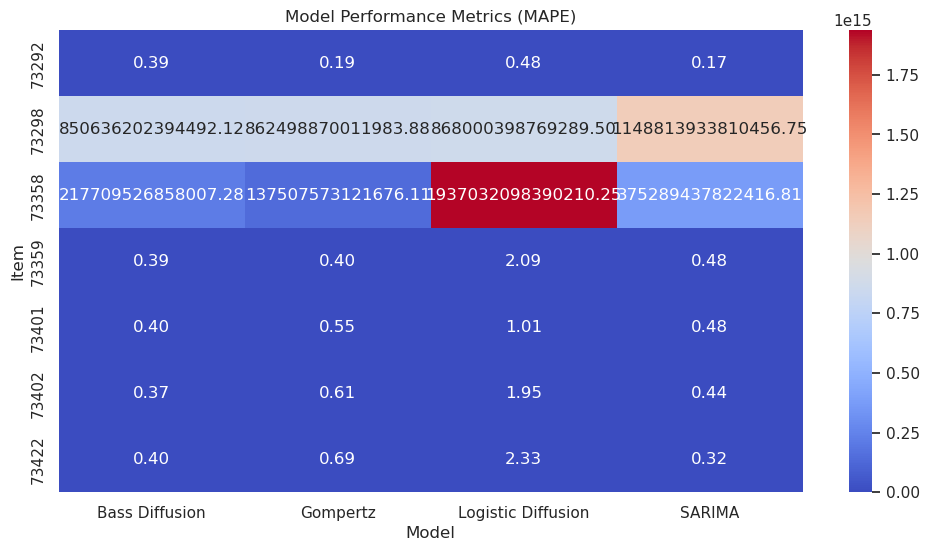

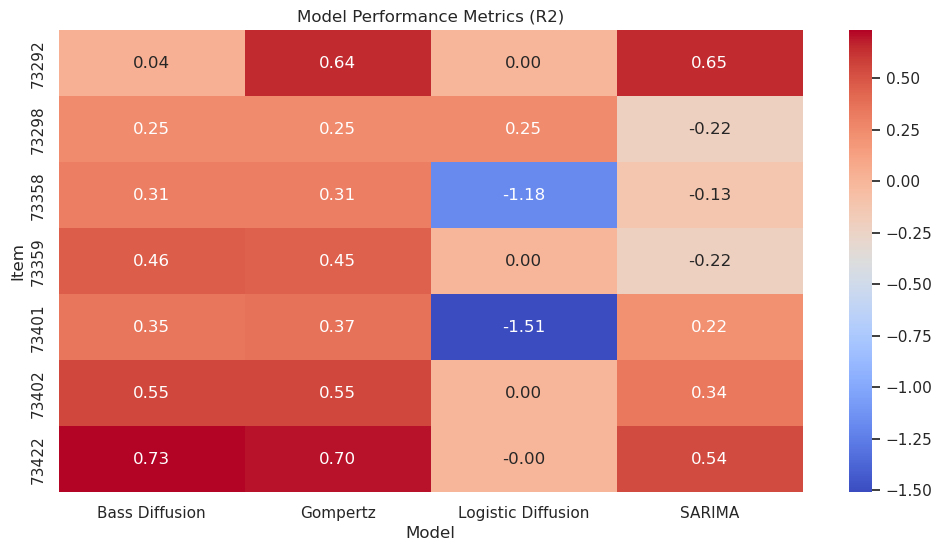

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score
import seaborn as sns

# Load the data (use your own path as needed)
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Strip whitespace from the "Item" column
data['Item'] = data['Item'].astype(str).str.strip()

# Ensure the "Month" column is treated as datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only specific "Item" categories
items_to_include = [
    '73292', '73298', '73299', '73358', '73359',
    '73360', '73395', '73401', '73402', '73422',
    '73425', '73426', '73442', '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)].copy()

# Drop categories with no data
data_counts = filtered_data.groupby('Item')['Value'].count()
valid_items = data_counts[data_counts > 0].index.tolist()
filtered_data = filtered_data[filtered_data['Item'].isin(valid_items)]

# Define model functions
def logistic_diffusion(t, K, r, t0):
    return K / (1 + np.exp(-r * (t - t0)))

def gompertz(t, a, b, c):
    return a * np.exp(-b * np.exp(-c * t))

def bass_diffusion(t, p, q, M):
    return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))

# Initialize dictionaries for results
model_results = []

# Plot settings
n_items = len(valid_items)
cols = 4
rows = int(np.ceil(n_items / cols))
fig, axes = plt.subplots(rows, cols, figsize=(20, 15))
axes = axes.flatten()

# Iterate through each item and fit models
for i, item in enumerate(valid_items):
    item_data = filtered_data[filtered_data['Item'] == item]['Value'].resample('ME').sum().dropna()

    if item_data.empty:
        print(f"Item {item} has no data after resampling. Skipping.")
        continue

    time_index = np.arange(len(item_data))
    models = {
        "Logistic Diffusion": logistic_diffusion,
        "Gompertz": gompertz,
        "Bass Diffusion": bass_diffusion
    }

    results = {}

    for model_name, model_func in models.items():
        try:
            params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
            predicted = model_func(time_index, *params)
            r2 = r2_score(item_data, predicted)
            mae = mean_absolute_error(item_data, predicted)
            mape = mean_absolute_percentage_error(item_data, predicted)

            results[model_name] = {
                'r2': r2, 'MAE': mae, 'MAPE': mape, 'predicted': predicted
            }
        except Exception as e:
            print(f"Error fitting {model_name} for item {item}: {e}")

    # Fit SARIMA model
    try:
        sarima_model = SARIMAX(item_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        sarima_fit = sarima_model.fit(disp=False)
        sarima_pred = sarima_fit.fittedvalues
        sarima_r2 = r2_score(item_data, sarima_pred)
        sarima_mae = mean_absolute_error(item_data, sarima_pred)
        sarima_mape = mean_absolute_percentage_error(item_data, sarima_pred)

        results["SARIMA"] = {
            'r2': sarima_r2, 'MAE': sarima_mae, 'MAPE': sarima_mape, 'predicted': sarima_pred
        }
    except Exception as e:
        print(f"Error fitting SARIMA for item {item}: {e}")

    # Store results
    for model_name, metrics in results.items():
        model_results.append({
            'Item': item,
            'Model': model_name,
            'r2': metrics['r2'],
            'MAE': metrics['MAE'],
            'MAPE': metrics['MAPE']
        })

    # Plot the actual vs predicted values
    ax = axes[i]
    ax.plot(item_data.index, item_data, label='Actual', marker='o')
    for model_name, metrics in results.items():
        ax.plot(item_data.index, metrics['predicted'], label=model_name, linestyle='--')
    ax.set_title(f'Item {item}')
    ax.legend()
    ax.set_xlabel('Date')
    ax.set_ylabel('Value')

# Remove empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# Convert model results to DataFrame and display
results_df = pd.DataFrame(model_results)
sns.set(style="whitegrid")

# Heatmap for MAE
plt.figure(figsize=(12, 6))
plt.title("Model Performance Metrics (MAE)")
results_pivot_mae = results_df.pivot(index="Item", columns="Model", values="MAE")
sns.heatmap(results_pivot_mae, annot=True, fmt=".2f", cmap="coolwarm")
plt.show()

# Heatmap for MAPE
plt.figure(figsize=(12, 6))
plt.title("Model Performance Metrics (MAPE)")
results_pivot_mape = results_df.pivot(index="Item", columns="Model", values="MAPE")
sns.heatmap(results_pivot_mape, annot=True, fmt=".2f", cmap="coolwarm")
plt.show()

# Heatmap for R2
plt.figure(figsize=(12, 6))
plt.title("Model Performance Metrics (R2)")
results_pivot_r2 = results_df.pivot(index="Item", columns="Model", values="r2")
sns.heatmap(results_pivot_r2, annot=True, fmt=".2f", cmap="coolwarm")
plt.show()


/tmp/ipykernel_497/2125309389.py:71: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
/tmp/ipykernel_497/2125309389.py:37: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * np.exp(-c * t))
/tmp/ipykernel_497/2125309389.py:71: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
/tmp/ipykernel_497/2125309389.py:34: RuntimeWarning: overflow encountered in exp
  return K / (1 + np.exp(-r * (t - t0)))
/tmp/ipykernel_497/2125309389.py:37: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * np.exp(-c * t))
/tmp/ipykernel_497/2125309389.py:40: RuntimeWarning: overflow encountered in exp
  return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))
/tmp/ipykernel_497/2125309389.py:40: RuntimeWarning: invalid value encountered in divide
  return M * (1 - np.exp(-(

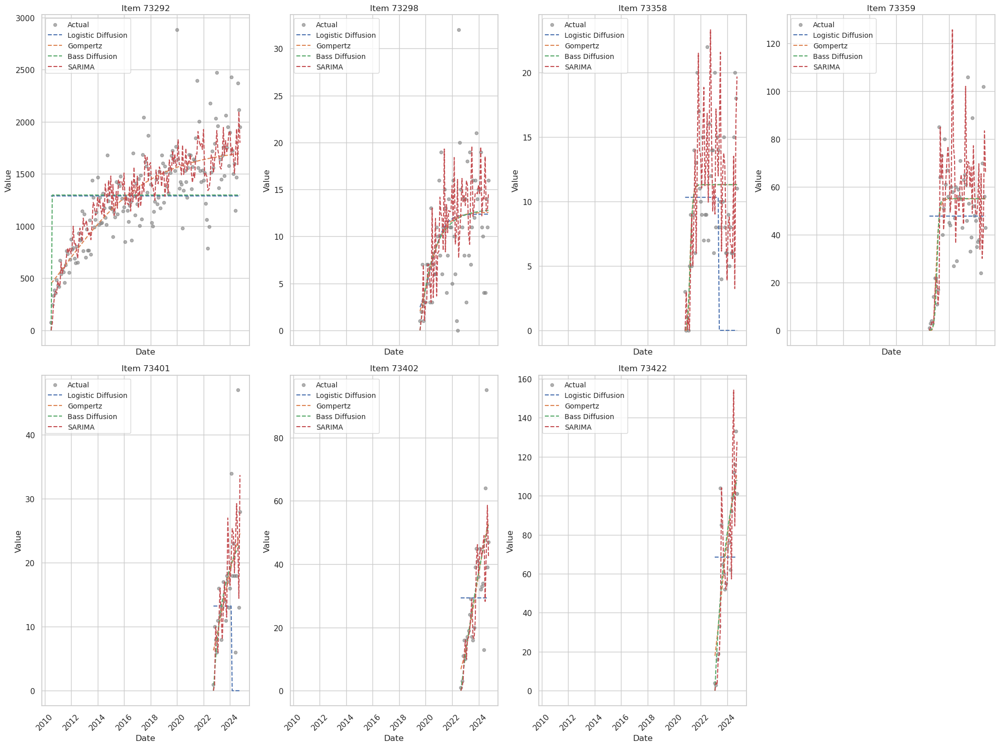

     Item               Model     r2     MAE      MAPE
0   73292  Logistic Diffusion   0.00  365.81      0.48
1   73292            Gompertz   0.64  197.30      0.19
2   73292      Bass Diffusion   0.04  359.14      0.39
3   73292              SARIMA   0.65  200.68      0.17
4   73298  Logistic Diffusion   0.25    3.98  8.68e+14
5   73298            Gompertz   0.25    3.97  8.62e+14
6   73298      Bass Diffusion   0.25    3.98  8.51e+14
7   73298              SARIMA  -0.22    4.96  1.15e+15
8   73358  Logistic Diffusion  -1.18    6.46  1.94e+15
9   73358            Gompertz   0.31    3.68  1.38e+14
10  73358      Bass Diffusion   0.31    3.69  2.18e+14
11  73358              SARIMA  -0.13    4.28  3.75e+14
12  73359  Logistic Diffusion   0.00   18.48      2.09
13  73359            Gompertz   0.45   13.24      0.40
14  73359      Bass Diffusion   0.46   13.24      0.39
15  73359              SARIMA  -0.22   20.01      0.48
16  73401  Logistic Diffusion  -1.51    9.99      1.01
17  73401 

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score

# Load the data (use your own path as needed)
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Strip whitespace from the "Item" column
data['Item'] = data['Item'].astype(str).str.strip()

# Ensure the "Month" column is treated as datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only specific "Item" categories
items_to_include = [
    '73292', '73298', '73299', '73358', '73359',
    '73360', '73395', '73401', '73402', '73422',
    '73425', '73426', '73442', '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)].copy()

# Drop categories with no data
data_counts = filtered_data.groupby('Item')['Value'].count()
valid_items = data_counts[data_counts > 0].index.tolist()
filtered_data = filtered_data[filtered_data['Item'].isin(valid_items)]

# Define model functions
def logistic_diffusion(t, K, r, t0):
    return K / (1 + np.exp(-r * (t - t0)))

def gompertz(t, a, b, c):
    return a * np.exp(-b * np.exp(-c * t))

def bass_diffusion(t, p, q, M):
    return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))

# Initialize dictionaries for results
model_results = []

# Plot settings
n_items = len(valid_items)
cols = 4
rows = int(np.ceil(n_items / cols))
fig, axes = plt.subplots(rows, cols, figsize=(20, 15), sharex=True)
axes = axes.flatten()

# Iterate through each item and fit models
for i, item in enumerate(valid_items):
    item_data = filtered_data[filtered_data['Item'] == item]['Value'].resample('ME').sum().dropna()

    if item_data.empty:
        print(f"Item {item} has no data after resampling. Skipping.")
        continue

    time_index = np.arange(len(item_data))
    models = {
        "Logistic Diffusion": logistic_diffusion,
        "Gompertz": gompertz,
        "Bass Diffusion": bass_diffusion
    }

    results = {}

    for model_name, model_func in models.items():
        try:
            params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
            predicted = model_func(time_index, *params)
            r2 = r2_score(item_data, predicted)
            mae = mean_absolute_error(item_data, predicted)
            mape = mean_absolute_percentage_error(item_data, predicted)

            results[model_name] = {
                'r2': r2, 'MAE': mae, 'MAPE': mape, 'predicted': predicted
            }
        except Exception as e:
            print(f"Error fitting {model_name} for item {item}: {e}")

    # Fit SARIMA model
    try:
        sarima_model = SARIMAX(item_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        sarima_fit = sarima_model.fit(disp=False)
        sarima_pred = sarima_fit.fittedvalues
        sarima_r2 = r2_score(item_data, sarima_pred)
        sarima_mae = mean_absolute_error(item_data, sarima_pred)
        sarima_mape = mean_absolute_percentage_error(item_data, sarima_pred)

        results["SARIMA"] = {
            'r2': sarima_r2, 'MAE': sarima_mae, 'MAPE': sarima_mape, 'predicted': sarima_pred
        }
    except Exception as e:
        print(f"Error fitting SARIMA for item {item}: {e}")

    # Store results
    for model_name, metrics in results.items():
        model_results.append({
            'Item': item,
            'Model': model_name,
            'r2': metrics['r2'],
            'MAE': metrics['MAE'],
            'MAPE': metrics['MAPE']
        })

    # Plot the actual vs predicted values
    ax = axes[i]
    ax.scatter(item_data.index, item_data, label='Actual', color='gray', alpha=0.6, s=20)
    for model_name, metrics in results.items():
        ax.plot(item_data.index, metrics['predicted'], label=model_name, linestyle='--')
    ax.set_title(f'Item {item}')
    ax.set_xlabel('Date')
    ax.set_ylabel('Value')
    ax.legend(loc='upper left', fontsize='small')
    ax.tick_params(axis='x', rotation=45)

# Remove empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# Convert model results to DataFrame and format values
results_df = pd.DataFrame(model_results)

# Format values for display
for column in ['MAE', 'MAPE', 'r2']:
    results_df[column] = results_df[column].apply(lambda x: f"{x:.2e}" if x >= 100000 else f"{x:.2f}")

print(results_df)


/tmp/ipykernel_497/1895641759.py:71: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
/tmp/ipykernel_497/1895641759.py:37: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * np.exp(-c * t))
/tmp/ipykernel_497/1895641759.py:71: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
/tmp/ipykernel_497/1895641759.py:34: RuntimeWarning: overflow encountered in exp
  return K / (1 + np.exp(-r * (t - t0)))
/tmp/ipykernel_497/1895641759.py:37: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * np.exp(-c * t))
/tmp/ipykernel_497/1895641759.py:40: RuntimeWarning: overflow encountered in exp
  return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))
/tmp/ipykernel_497/1895641759.py:40: RuntimeWarning: invalid value encountered in divide
  return M * (1 - np.exp(-(

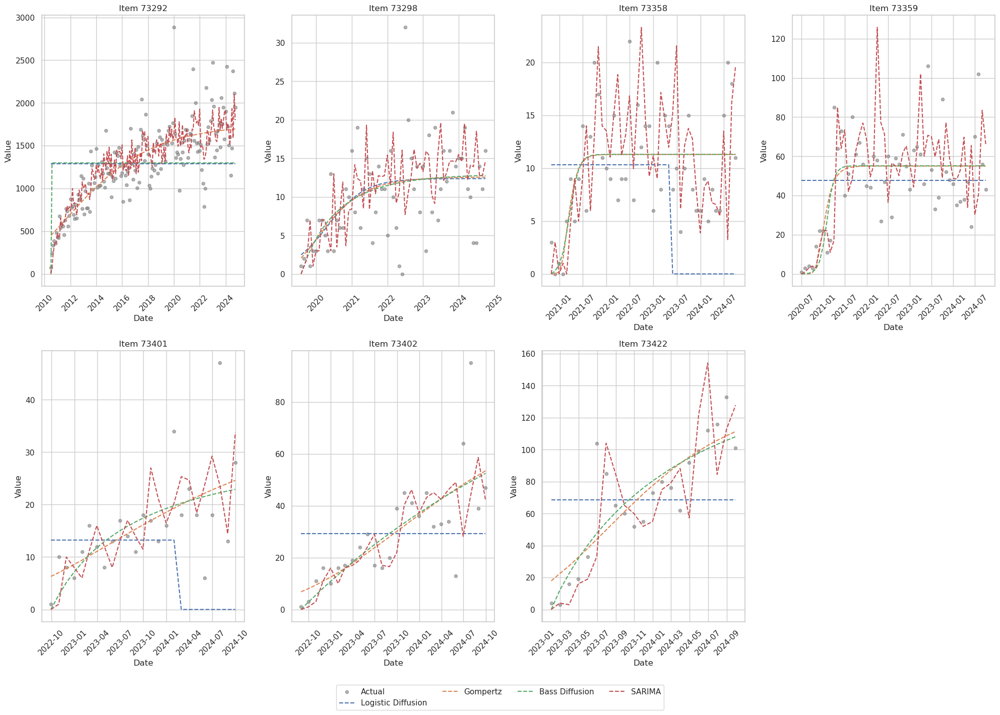

     Item               Model     r2     MAE      MAPE
0   73292  Logistic Diffusion   0.00  365.81      0.48
1   73292            Gompertz   0.64  197.30      0.19
2   73292      Bass Diffusion   0.04  359.14      0.39
3   73292              SARIMA   0.65  200.68      0.17
4   73298  Logistic Diffusion   0.25    3.98  8.68e+14
5   73298            Gompertz   0.25    3.97  8.62e+14
6   73298      Bass Diffusion   0.25    3.98  8.51e+14
7   73298              SARIMA  -0.22    4.96  1.15e+15
8   73358  Logistic Diffusion  -1.18    6.46  1.94e+15
9   73358            Gompertz   0.31    3.68  1.38e+14
10  73358      Bass Diffusion   0.31    3.69  2.18e+14
11  73358              SARIMA  -0.13    4.28  3.75e+14
12  73359  Logistic Diffusion   0.00   18.48      2.09
13  73359            Gompertz   0.45   13.24      0.40
14  73359      Bass Diffusion   0.46   13.24      0.39
15  73359              SARIMA  -0.22   20.01      0.48
16  73401  Logistic Diffusion  -1.51    9.99      1.01
17  73401 

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score

# Load the data (use your own path as needed)
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Strip whitespace from the "Item" column
data['Item'] = data['Item'].astype(str).str.strip()

# Ensure the "Month" column is treated as datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only specific "Item" categories
items_to_include = [
    '73292', '73298', '73299', '73358', '73359',
    '73360', '73395', '73401', '73402', '73422',
    '73425', '73426', '73442', '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)].copy()

# Drop categories with no data
data_counts = filtered_data.groupby('Item')['Value'].count()
valid_items = data_counts[data_counts > 0].index.tolist()
filtered_data = filtered_data[filtered_data['Item'].isin(valid_items)]

# Define model functions
def logistic_diffusion(t, K, r, t0):
    return K / (1 + np.exp(-r * (t - t0)))

def gompertz(t, a, b, c):
    return a * np.exp(-b * np.exp(-c * t))

def bass_diffusion(t, p, q, M):
    return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))

# Initialize dictionaries for results
model_results = []

# Plot settings
n_items = len(valid_items)
cols = 4
rows = int(np.ceil(n_items / cols))
fig, axes = plt.subplots(rows, cols, figsize=(20, 15))
axes = axes.flatten()

# Iterate through each item and fit models
for i, item in enumerate(valid_items):
    item_data = filtered_data[filtered_data['Item'] == item]['Value'].resample('ME').sum().dropna()

    if item_data.empty:
        print(f"Item {item} has no data after resampling. Skipping.")
        continue

    time_index = np.arange(len(item_data))
    models = {
        "Logistic Diffusion": logistic_diffusion,
        "Gompertz": gompertz,
        "Bass Diffusion": bass_diffusion
    }

    results = {}

    for model_name, model_func in models.items():
        try:
            params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
            predicted = model_func(time_index, *params)
            r2 = r2_score(item_data, predicted)
            mae = mean_absolute_error(item_data, predicted)
            mape = mean_absolute_percentage_error(item_data, predicted)

            results[model_name] = {
                'r2': r2, 'MAE': mae, 'MAPE': mape, 'predicted': predicted
            }
        except Exception as e:
            print(f"Error fitting {model_name} for item {item}: {e}")

    # Fit SARIMA model
    try:
        sarima_model = SARIMAX(item_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        sarima_fit = sarima_model.fit(disp=False)
        sarima_pred = sarima_fit.fittedvalues
        sarima_r2 = r2_score(item_data, sarima_pred)
        sarima_mae = mean_absolute_error(item_data, sarima_pred)
        sarima_mape = mean_absolute_percentage_error(item_data, sarima_pred)

        results["SARIMA"] = {
            'r2': sarima_r2, 'MAE': sarima_mae, 'MAPE': sarima_mape, 'predicted': sarima_pred
        }
    except Exception as e:
        print(f"Error fitting SARIMA for item {item}: {e}")

    # Store results
    for model_name, metrics in results.items():
        model_results.append({
            'Item': item,
            'Model': model_name,
            'r2': metrics['r2'],
            'MAE': metrics['MAE'],
            'MAPE': metrics['MAPE']
        })

    # Plot the actual vs predicted values
    ax = axes[i]
    ax.scatter(item_data.index, item_data, label='Actual', color='gray', alpha=0.6, s=20)
    for model_name, metrics in results.items():
        ax.plot(item_data.index, metrics['predicted'], label=model_name, linestyle='--')
    ax.set_title(f'Item {item}')
    ax.set_xlabel('Date')
    ax.set_ylabel('Value')
    ax.tick_params(axis='x', rotation=45)

# Remove empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add one legend for the entire plot
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=4, bbox_to_anchor=(0.5, 0.05))

plt.tight_layout(rect=[0, 0.1, 1, 1])
plt.show()

# Convert model results to DataFrame and format values
results_df = pd.DataFrame(model_results)

# Format values for display
for column in ['MAE', 'MAPE', 'r2']:
    results_df[column] = results_df[column].apply(lambda x: f"{x:.2e}" if x >= 100000 else f"{x:.2f}")

print(results_df)


/tmp/ipykernel_497/3279598902.py:77: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
/tmp/ipykernel_497/3279598902.py:37: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * np.exp(-c * t))
/tmp/ipykernel_497/3279598902.py:77: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
/tmp/ipykernel_497/3279598902.py:110: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  pd.date_range(start=item_data.index[0], periods=len(prediction_index), freq='M'),
/tmp/ipykernel_497/3279598902.py:34: RuntimeWarning: overflow encountered in exp
  return K / (1 + np.exp(-r * (t - t0)))
/tmp/ipykernel_497/3279598902.py:37: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * np.exp(-c * t))
/tmp/ipykernel_497/3279598902.py:40: RuntimeWarning: ov

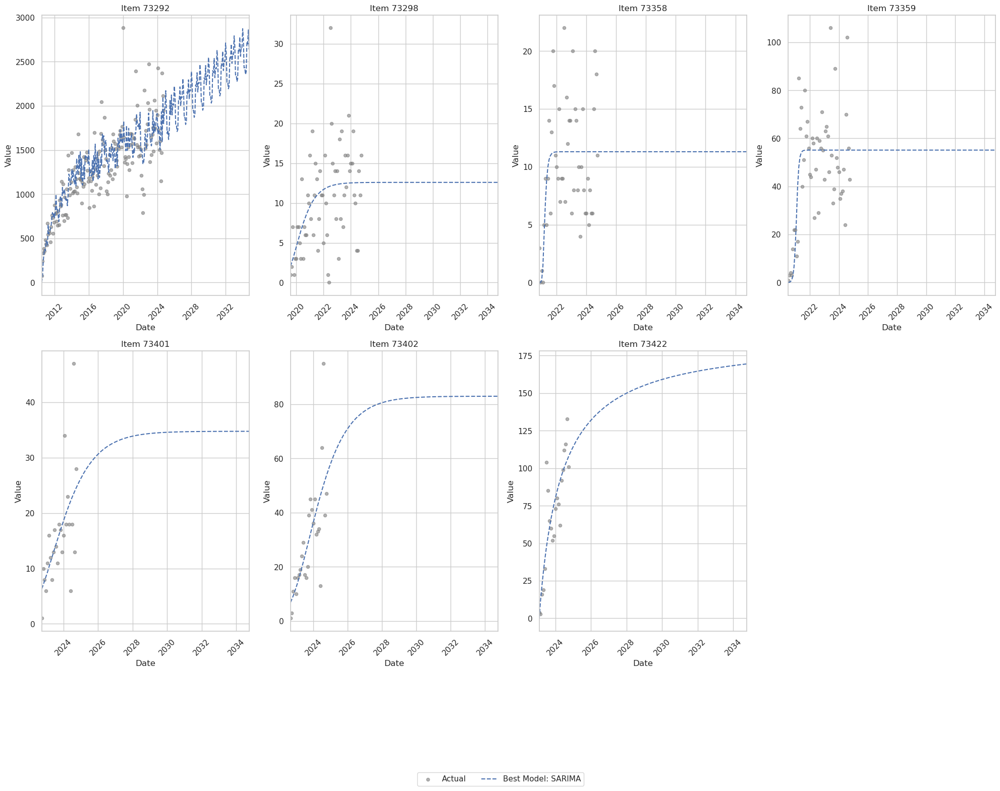

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score

# Load the data (use your own path as needed)
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Strip whitespace from the "Item" column
data['Item'] = data['Item'].astype(str).str.strip()

# Ensure the "Month" column is treated as datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only specific "Item" categories
items_to_include = [
    '73292', '73298', '73299', '73358', '73359',
    '73360', '73395', '73401', '73402', '73422',
    '73425', '73426', '73442', '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)].copy()

# Drop categories with no data
data_counts = filtered_data.groupby('Item')['Value'].count()
valid_items = data_counts[data_counts > 0].index.tolist()
filtered_data = filtered_data[filtered_data['Item'].isin(valid_items)]

# Define model functions
def logistic_diffusion(t, K, r, t0):
    return K / (1 + np.exp(-r * (t - t0)))

def gompertz(t, a, b, c):
    return a * np.exp(-b * np.exp(-c * t))

def bass_diffusion(t, p, q, M):
    return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))

# Initialize dictionaries for results
model_results = []

# Prediction range
prediction_end = pd.Timestamp('2034-09-30')

# Plot settings
n_items = len(valid_items)
cols = 4
rows = int(np.ceil(n_items / cols))
fig, axes = plt.subplots(rows, cols, figsize=(20, 15))
axes = axes.flatten()

# Iterate through each item and fit models
for i, item in enumerate(valid_items):
    item_data = filtered_data[filtered_data['Item'] == item]['Value'].resample('ME').sum().dropna()

    if item_data.empty:
        print(f"Item {item} has no data after resampling. Skipping.")
        continue

    time_index = np.arange(len(item_data))
    prediction_index = np.arange(len(item_data) + (prediction_end - item_data.index[-1]).days // 30 + 1)
    models = {
        "Logistic Diffusion": logistic_diffusion,
        "Gompertz": gompertz,
        "Bass Diffusion": bass_diffusion
    }

    best_model_name = None
    best_model_metrics = {'r2': -np.inf}  # Initialize with the worst r2 value
    best_model_predicted = None

    for model_name, model_func in models.items():
        try:
            params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
            predicted = model_func(time_index, *params)
            future_predicted = model_func(prediction_index, *params)
            r2 = r2_score(item_data, predicted)

            if r2 > best_model_metrics['r2']:
                best_model_name = model_name
                best_model_metrics = {'r2': r2}
                best_model_predicted = future_predicted
        except Exception as e:
            print(f"Error fitting {model_name} for item {item}: {e}")

    # Fit SARIMA model
    try:
        sarima_model = SARIMAX(item_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        sarima_fit = sarima_model.fit(disp=False)
        sarima_pred = sarima_fit.fittedvalues
        future_sarima_pred = sarima_fit.get_forecast(steps=len(prediction_index) - len(time_index)).predicted_mean
        future_predicted_sarima = np.concatenate([sarima_pred, future_sarima_pred])

        sarima_r2 = r2_score(item_data, sarima_pred)

        if sarima_r2 > best_model_metrics['r2']:
            best_model_name = "SARIMA"
            best_model_metrics = {'r2': sarima_r2}
            best_model_predicted = future_predicted_sarima
    except Exception as e:
        print(f"Error fitting SARIMA for item {item}: {e}")

    # Plot the actual vs predicted values
    ax = axes[i]
    ax.scatter(item_data.index, item_data, label='Actual', color='gray', alpha=0.6, s=20)
    ax.plot(
        pd.date_range(start=item_data.index[0], periods=len(prediction_index), freq='M'),
        best_model_predicted,
        label=f'Best Model: {best_model_name}',
        linestyle='--'
    )
    ax.set_title(f'Item {item}')
    ax.set_xlabel('Date')
    ax.set_ylabel('Value')
    ax.tick_params(axis='x', rotation=45)
    ax.set_xlim([item_data.index[0], prediction_end])

# Remove empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add one legend for the entire plot
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=4, bbox_to_anchor=(0.5, -0.05))

plt.tight_layout(rect=[0, 0.1, 1, 1])
plt.show()


/tmp/ipykernel_497/2682392981.py:65: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
/tmp/ipykernel_497/2682392981.py:36: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * np.exp(-c * t))
/tmp/ipykernel_497/2682392981.py:33: RuntimeWarning: overflow encountered in exp
  return K / (1 + np.exp(-r * (t - t0)))
/tmp/ipykernel_497/2682392981.py:39: RuntimeWarning: overflow encountered in exp
  return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))
/tmp/ipykernel_497/2682392981.py:39: RuntimeWarning: invalid value encountered in divide
  return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))
/tmp/ipykernel_497/2682392981.py:39: RuntimeWarning: overflow encountered in multiply
  return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))
/tmp/ipykernel_497/2682392981.py:104: OptimizeWarning: Covariance of the parameters 

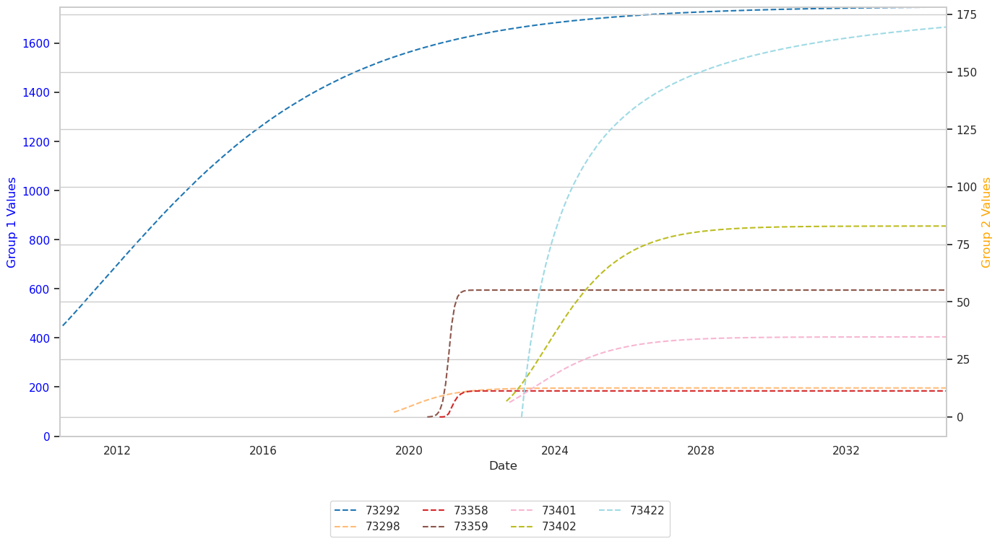

In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score

# Load the data (use your own path as needed)
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Strip whitespace from the "Item" column
data['Item'] = data['Item'].astype(str).str.strip()

# Ensure the "Month" column is treated as datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only specific "Item" categories
items_to_include = [
    '73292', '73298', '73299', '73358', '73359',
    '73360', '73395', '73401', '73402', '73422',
    '73425', '73426', '73442', '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)].copy()

# Drop categories with no data
data_counts = filtered_data.groupby('Item')['Value'].count()
valid_items = data_counts[data_counts > 0].index.tolist()
filtered_data = filtered_data[filtered_data['Item'].isin(valid_items)]

# Define model functions
def logistic_diffusion(t, K, r, t0):
    return K / (1 + np.exp(-r * (t - t0)))

def gompertz(t, a, b, c):
    return a * np.exp(-b * np.exp(-c * t))

def bass_diffusion(t, p, q, M):
    return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))

# Initialize dictionaries for results
model_results = []

# Prediction range
prediction_end = pd.Timestamp('2034-09-30')

# Separate items into two groups
group1 = ['73292']
group2 = [item for item in valid_items if item not in group1]

# Determine common x and y axis ranges
common_x_start = filtered_data.index.min()
common_x_end = prediction_end

# Get future predictions to include in y-axis range
def calculate_future_range(data, models):
    all_values = data['Value'].tolist()
    for item in valid_items:
        item_data = data[data['Item'] == item]['Value'].resample('ME').sum().dropna()
        if not item_data.empty:
            time_index = np.arange(len(item_data))
            prediction_index = np.arange(len(item_data) + (prediction_end - item_data.index[-1]).days // 30 + 1)
            for model_name, model_func in models.items():
                try:
                    params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
                    future_predicted = model_func(prediction_index, *params)
                    all_values.extend(future_predicted)
                except Exception:
                    continue
    return min(all_values), max(all_values)

models = {
    "Logistic Diffusion": logistic_diffusion,
    "Gompertz": gompertz,
    "Bass Diffusion": bass_diffusion
}
common_y_min, common_y_max = calculate_future_range(filtered_data, models)

# Plot settings
fig, ax = plt.subplots(figsize=(14, 8))
colors = plt.cm.tab20(np.linspace(0, 1, len(valid_items)))
color_mapping = dict(zip(valid_items, colors))

# Storage for legend entries
legend_handles = []

# Iterate through each group and fit models
for group, axis in [(group1, ax), (group2, ax.twinx())]:
    for item in group:
        item_data = filtered_data[filtered_data['Item'] == item]['Value'].resample('ME').sum().dropna()

        if item_data.empty:
            print(f"Item {item} has no data after resampling. Skipping.")
            continue

        time_index = np.arange(len(item_data))
        prediction_index = np.arange(len(item_data) + (prediction_end - item_data.index[-1]).days // 30 + 1)
        best_model_name = None
        best_model_metrics = {'r2': -np.inf}  # Initialize with the worst r2 value
        best_model_predicted = None

        for model_name, model_func in models.items():
            try:
                params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
                predicted = model_func(time_index, *params)
                future_predicted = model_func(prediction_index, *params)
                r2 = r2_score(item_data, predicted)

                if r2 > best_model_metrics['r2']:
                    best_model_name = model_name
                    best_model_metrics = {'r2': r2}
                    best_model_predicted = future_predicted
            except Exception as e:
                print(f"Error fitting {model_name} for item {item}: {e}")

        # Plot the actual vs predicted values
        axis.plot(
            pd.date_range(start=item_data.index[0], periods=len(prediction_index), freq='M'),
            best_model_predicted,
            label=f'{item} Best Model: {best_model_name}',
            linestyle='--', color=color_mapping[item]
        )

        # Store legend handles
        legend_handles.append(plt.Line2D([], [], color=color_mapping[item], linestyle='--', label=f'{item}'))

# Set common limits and labels
ax.set_xlim([common_x_start, common_x_end])
ax.set_ylim([common_y_min, common_y_max])
ax.set_xlabel('Date')
ax.set_ylabel('Group 1 Values', color='blue')
ax.tick_params(axis='y', labelcolor='blue')

ax2 = ax.twinx()
ax2.set_ylim([common_y_min, common_y_max])
ax2.set_ylabel('Group 2 Values', color='orange', labelpad=35)  # Move secondary axis label rightward
ax2.tick_params(axis='y', labelcolor='orange')
ax2.yaxis.set_ticks([])  # Remove secondary axis tick labels entirely

# Remove all gridlines explicitly
ax.grid(False, which='both')
ax2.grid(False, which='both')

# Add one legend for the entire plot
fig.legend(handles=legend_handles, loc='lower center', ncol=4, bbox_to_anchor=(0.5, 0.05))

plt.tight_layout(rect=[0, 0.15, 1, 1])
plt.show()


/tmp/ipykernel_497/1890475023.py:63: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
/tmp/ipykernel_497/1890475023.py:36: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * np.exp(-c * t))
/tmp/ipykernel_497/1890475023.py:63: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
/tmp/ipykernel_497/1890475023.py:33: RuntimeWarning: overflow encountered in exp
  return K / (1 + np.exp(-r * (t - t0)))
/tmp/ipykernel_497/1890475023.py:36: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * np.exp(-c * t))
/tmp/ipykernel_497/1890475023.py:39: RuntimeWarning: overflow encountered in exp
  return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))
/tmp/ipykernel_497/1890475023.py:39: RuntimeWarning: invalid value encountered in divide
  return M * (1 - np.exp(-(

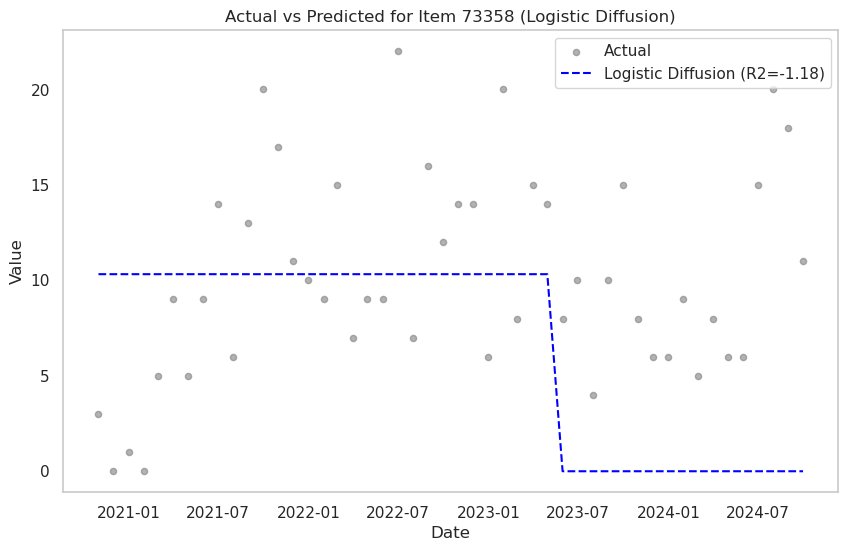

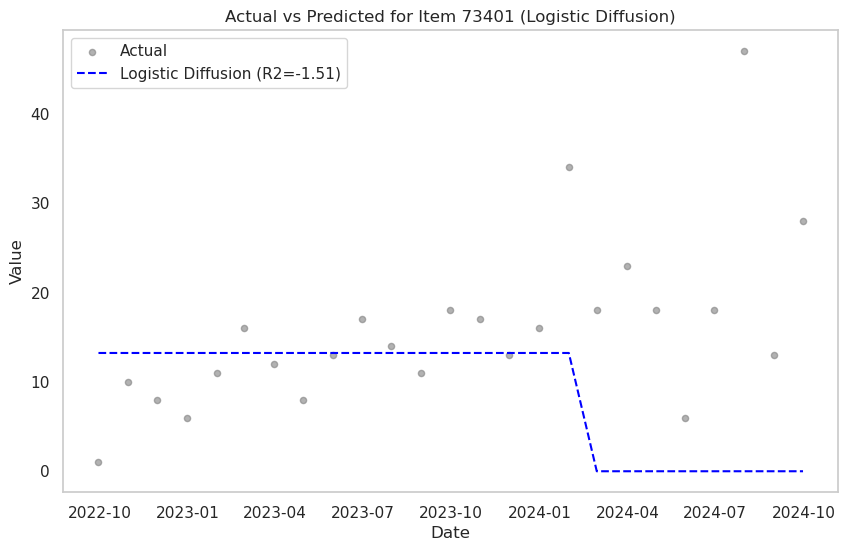

All Results:
     Item               Model            r2         MAE          MAPE
0   73292  Logistic Diffusion  0.000000e+00  365.808140  4.760472e-01
1   73292            Gompertz  6.449168e-01  197.298238  1.888531e-01
2   73292      Bass Diffusion  3.968492e-02  359.144431  3.909869e-01
3   73298  Logistic Diffusion  2.481823e-01    3.984120  8.680004e+14
4   73298            Gompertz  2.498361e-01    3.971439  8.624989e+14
5   73298      Bass Diffusion  2.479266e-01    3.980553  8.506362e+14
6   73358  Logistic Diffusion -1.184516e+00    6.457661  1.937032e+15
7   73358            Gompertz  3.083566e-01    3.677738  1.375076e+14
8   73358      Bass Diffusion  3.075977e-01    3.685599  2.177095e+14
9   73359  Logistic Diffusion  0.000000e+00   18.480769  2.085595e+00
10  73359            Gompertz  4.507048e-01   13.235992  4.005114e-01
11  73359      Bass Diffusion  4.616883e-01   13.238131  3.935034e-01
12  73401  Logistic Diffusion -1.510387e+00    9.988235  1.013505e+00
13  734

In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score

# Load the data (use your own path as needed)
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Strip whitespace from the "Item" column
data['Item'] = data['Item'].astype(str).str.strip()

# Ensure the "Month" column is treated as datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only specific "Item" categories
items_to_include = [
    '73292', '73298', '73299', '73358', '73359',
    '73360', '73395', '73401', '73402', '73422',
    '73425', '73426', '73442', '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)].copy()

# Drop categories with no data
data_counts = filtered_data.groupby('Item')['Value'].count()
valid_items = data_counts[data_counts > 0].index.tolist()
filtered_data = filtered_data[filtered_data['Item'].isin(valid_items)]

# Define model functions
def logistic_diffusion(t, K, r, t0):
    return K / (1 + np.exp(-r * (t - t0)))

def gompertz(t, a, b, c):
    return a * np.exp(-b * np.exp(-c * t))

def bass_diffusion(t, p, q, M):
    return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))

# Initialize dictionaries for results
model_results = []
problematic_items = []

# Iterate through each item and fit models
for item in valid_items:
    item_data = filtered_data[filtered_data['Item'] == item]['Value'].resample('ME').sum().dropna()

    if item_data.empty:
        print(f"Item {item} has no data after resampling. Skipping.")
        continue

    time_index = np.arange(len(item_data))
    models = {
        "Logistic Diffusion": logistic_diffusion,
        "Gompertz": gompertz,
        "Bass Diffusion": bass_diffusion
    }

    for model_name, model_func in models.items():
        try:
            # Fit the model
            params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
            predicted = model_func(time_index, *params)
            r2 = 1 - np.sum((item_data - predicted) ** 2) / np.sum((item_data - np.mean(item_data)) ** 2)

            # Store results
            model_results.append({
                'Item': item,
                'Model': model_name,
                'r2': r2,
                'MAE': mean_absolute_error(item_data, predicted),
                'MAPE': mean_absolute_percentage_error(item_data, predicted)
            })

            # Check for problematic R²
            if r2 < -1 or r2 > 1:
                problematic_items.append({
                    'Item': item,
                    'Model': model_name,
                    'R2': r2
                })
        except Exception as e:
            print(f"Error fitting {model_name} for item {item}: {e}")

# Convert results to DataFrame
results_df = pd.DataFrame(model_results)
problematic_df = pd.DataFrame(problematic_items)

# Plot actual vs predicted for problematic items
for _, row in problematic_df.iterrows():
    item = row['Item']
    model_name = row['Model']

    item_data = filtered_data[filtered_data['Item'] == item]['Value'].resample('ME').sum().dropna()
    time_index = np.arange(len(item_data))

    if model_name == "Logistic Diffusion":
        model_func = logistic_diffusion
    elif model_name == "Gompertz":
        model_func = gompertz
    elif model_name == "Bass Diffusion":
        model_func = bass_diffusion

    # Recalculate predictions
    params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
    predicted = model_func(time_index, *params)

    # Plot
    plt.figure(figsize=(10, 6))
    plt.scatter(item_data.index, item_data, label='Actual', color='gray', alpha=0.6, s=20)
    plt.plot(item_data.index, predicted, label=f'{model_name} (R2={row["R2"]:.2f})', linestyle='--', color='blue')
    plt.title(f'Actual vs Predicted for Item {item} ({model_name})')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    plt.grid()
    plt.show()

# Output tables
print("All Results:")
print(results_df)

print("\nProblematic R2 Values:")
print(problematic_df)


/tmp/ipykernel_497/274851013.py:64: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
/tmp/ipykernel_497/274851013.py:37: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * np.exp(-c * t))
/tmp/ipykernel_497/274851013.py:64: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
/tmp/ipykernel_497/274851013.py:34: RuntimeWarning: overflow encountered in exp
  return K / (1 + np.exp(-r * (t - t0)))
/tmp/ipykernel_497/274851013.py:37: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * np.exp(-c * t))
/tmp/ipykernel_497/274851013.py:40: RuntimeWarning: overflow encountered in exp
  return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))
/tmp/ipykernel_497/274851013.py:40: RuntimeWarning: invalid value encountered in divide
  return M * (1 - np.exp(-(p + q) 

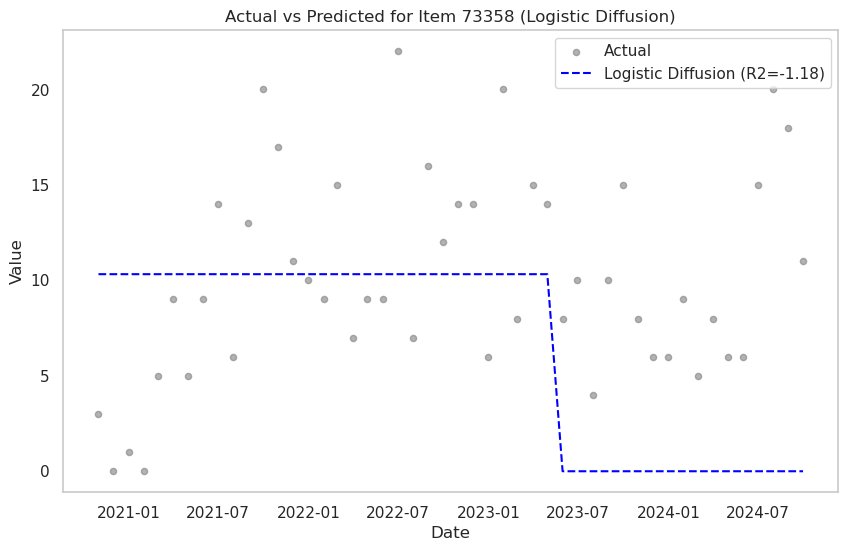

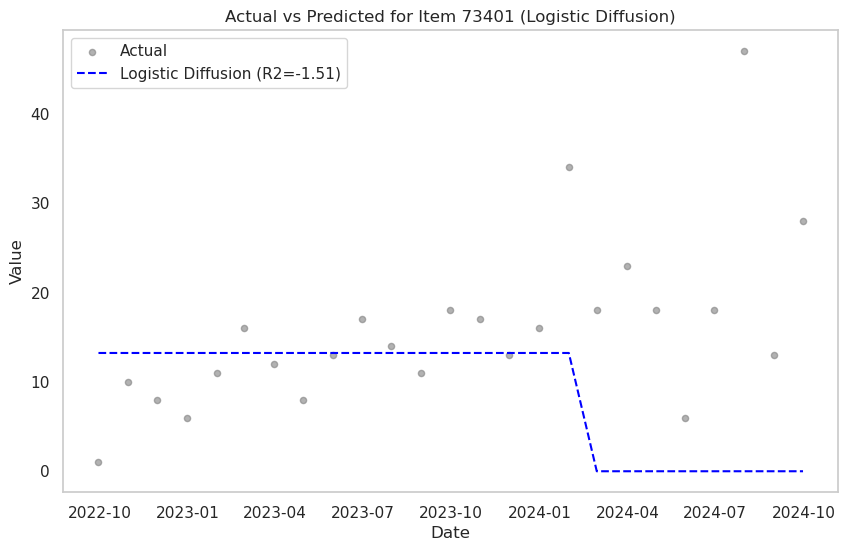

All Results:
     Item               Model            r2         MAE          MAPE
0   73292  Logistic Diffusion  0.000000e+00  365.808140  4.760472e-01
1   73292            Gompertz  6.449168e-01  197.298238  1.888531e-01
2   73292      Bass Diffusion  3.968492e-02  359.144431  3.909869e-01
3   73292              SARIMA  6.516021e-01  200.682901  1.700874e-01
4   73298  Logistic Diffusion  2.481823e-01    3.984120  8.680004e+14
5   73298            Gompertz  2.498361e-01    3.971439  8.624989e+14
6   73298      Bass Diffusion  2.479266e-01    3.980553  8.506362e+14
7   73298              SARIMA -2.225046e-01    4.957118  1.148814e+15
8   73358  Logistic Diffusion -1.184516e+00    6.457661  1.937032e+15
9   73358            Gompertz  3.083566e-01    3.677738  1.375076e+14
10  73358      Bass Diffusion  3.075977e-01    3.685599  2.177095e+14
11  73358              SARIMA -1.252603e-01    4.280370  3.752894e+14
12  73359  Logistic Diffusion  0.000000e+00   18.480769  2.085595e+00
13  733

In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Load the data (use your own path as needed)
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Strip whitespace from the "Item" column
data['Item'] = data['Item'].astype(str).str.strip()

# Ensure the "Month" column is treated as datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only specific "Item" categories
items_to_include = [
    '73292', '73298', '73299', '73358', '73359',
    '73360', '73395', '73401', '73402', '73422',
    '73425', '73426', '73442', '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)].copy()

# Drop categories with no data
data_counts = filtered_data.groupby('Item')['Value'].count()
valid_items = data_counts[data_counts > 0].index.tolist()
filtered_data = filtered_data[filtered_data['Item'].isin(valid_items)]

# Define model functions
def logistic_diffusion(t, K, r, t0):
    return K / (1 + np.exp(-r * (t - t0)))

def gompertz(t, a, b, c):
    return a * np.exp(-b * np.exp(-c * t))

def bass_diffusion(t, p, q, M):
    return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))

# Initialize dictionaries for results
model_results = []
problematic_items = []

# Iterate through each item and fit models
for item in valid_items:
    item_data = filtered_data[filtered_data['Item'] == item]['Value'].resample('ME').sum().dropna()

    if item_data.empty:
        print(f"Item {item} has no data after resampling. Skipping.")
        continue

    time_index = np.arange(len(item_data))
    models = {
        "Logistic Diffusion": logistic_diffusion,
        "Gompertz": gompertz,
        "Bass Diffusion": bass_diffusion
    }

    for model_name, model_func in models.items():
        try:
            # Fit the model
            params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
            predicted = model_func(time_index, *params)
            r2 = 1 - np.sum((item_data - predicted) ** 2) / np.sum((item_data - np.mean(item_data)) ** 2)

            # Store results
            model_results.append({
                'Item': item,
                'Model': model_name,
                'r2': r2,
                'MAE': mean_absolute_error(item_data, predicted),
                'MAPE': mean_absolute_percentage_error(item_data, predicted)
            })

            # Check for problematic R²
            if r2 < -1 or r2 > 1:
                problematic_items.append({
                    'Item': item,
                    'Model': model_name,
                    'R2': r2
                })
        except Exception as e:
            print(f"Error fitting {model_name} for item {item}: {e}")

    # Fit SARIMA model
    try:
        sarima_model = SARIMAX(item_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        sarima_fit = sarima_model.fit(disp=False)
        sarima_pred = sarima_fit.fittedvalues
        sarima_r2 = 1 - np.sum((item_data - sarima_pred) ** 2) / np.sum((item_data - np.mean(item_data)) ** 2)

        model_results.append({
            'Item': item,
            'Model': "SARIMA",
            'r2': sarima_r2,
            'MAE': mean_absolute_error(item_data, sarima_pred),
            'MAPE': mean_absolute_percentage_error(item_data, sarima_pred)
        })

        if sarima_r2 < -1 or sarima_r2 > 1:
            problematic_items.append({
                'Item': item,
                'Model': "SARIMA",
                'R2': sarima_r2
            })
    except Exception as e:
        print(f"Error fitting SARIMA for item {item}: {e}")

# Convert results to DataFrame
results_df = pd.DataFrame(model_results)
problematic_df = pd.DataFrame(problematic_items)

# Plot actual vs predicted for problematic items
for _, row in problematic_df.iterrows():
    item = row['Item']
    model_name = row['Model']

    item_data = filtered_data[filtered_data['Item'] == item]['Value'].resample('ME').sum().dropna()
    time_index = np.arange(len(item_data))

    if model_name == "Logistic Diffusion":
        model_func = logistic_diffusion
    elif model_name == "Gompertz":
        model_func = gompertz
    elif model_name == "Bass Diffusion":
        model_func = bass_diffusion
    elif model_name == "SARIMA":
        sarima_model = SARIMAX(item_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        sarima_fit = sarima_model.fit(disp=False)
        predicted = sarima_fit.fittedvalues
    else:
        continue

    if model_name != "SARIMA":
        params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
        predicted = model_func(time_index, *params)

    # Plot
    plt.figure(figsize=(10, 6))
    plt.scatter(item_data.index, item_data, label='Actual', color='gray', alpha=0.6, s=20)
    plt.plot(item_data.index, predicted, label=f'{model_name} (R2={row["R2"]:.2f})', linestyle='--', color='blue')
    plt.title(f'Actual vs Predicted for Item {item} ({model_name})')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    plt.grid()
    plt.show()

# Output tables
print("All Results:")
print(results_df)

print("\nProblematic R2 Values:")
print(problematic_df)


In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Load the data (use your own path as needed)
file_path = "/mnt/c/Users/doughnut/OneDrive - The University of Melbourne/Phase 1 - Study 4 - Australian Genetic and Genomic Test Utilisation/MBSGeneticsBenefit_202410.feather"
data = pd.read_feather(file_path)

# Strip whitespace from the "Item" column
data['Item'] = data['Item'].astype(str).str.strip()

# Ensure the "Month" column is treated as datetime and set as index
data['Month'] = pd.to_datetime(data['Month']).dt.to_period('M').dt.to_timestamp()
data.set_index('Month', inplace=True)

# Filter the data to include only specific "Item" categories
items_to_include = [
    '73292', '73298', '73299', '73358', '73359',
    '73360', '73395', '73401', '73402', '73422',
    '73425', '73426', '73442', '73456', '73457', '73458'
]
filtered_data = data[data['Item'].isin(items_to_include)].copy()

# Drop categories with no data
data_counts = filtered_data.groupby('Item')['Value'].count()
valid_items = data_counts[data_counts > 0].index.tolist()
filtered_data = filtered_data[filtered_data['Item'].isin(valid_items)]

# Define model functions
def logistic_diffusion(t, K, r, t0):
    return K / (1 + np.exp(-r * (t - t0)))

def gompertz(t, a, b, c):
    return a * np.exp(-b * np.exp(-c * t))

def bass_diffusion(t, p, q, M):
    return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))

# Initialize dictionaries for results
model_results = []
problematic_items = []

# Iterate through each item and fit models
for item in valid_items:
    item_data = filtered_data[filtered_data['Item'] == item]['Value'].resample('ME').sum().dropna()

    if item_data.empty:
        print(f"Item {item} has no data after resampling. Skipping.")
        continue

    time_index = np.arange(len(item_data))
    models = {
        "Logistic Diffusion": logistic_diffusion,
        "Gompertz": gompertz,
        "Bass Diffusion": bass_diffusion
    }

    for model_name, model_func in models.items():
        try:
            # Fit the model
            params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
            predicted = model_func(time_index, *params)
            r2 = 1 - np.sum((item_data - predicted) ** 2) / np.sum((item_data - np.mean(item_data)) ** 2)

            # Store results
            model_results.append({
                'Item': item,
                'Model': model_name,
                'r2': r2,
                'MAE': mean_absolute_error(item_data, predicted),
                'MAPE': mean_absolute_percentage_error(item_data, predicted)
            })

            # Check for problematic R²
            if r2 < -1 or r2 > 1:
                problematic_items.append({
                    'Item': item,
                    'Model': model_name,
                    'R2': r2
                })
        except Exception as e:
            print(f"Error fitting {model_name} for item {item}: {e}")

    # Fit SARIMA model
    try:
        sarima_model = SARIMAX(item_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        sarima_fit = sarima_model.fit(disp=False)
        sarima_pred = sarima_fit.fittedvalues
        sarima_r2 = 1 - np.sum((item_data - sarima_pred) ** 2) / np.sum((item_data - np.mean(item_data)) ** 2)

        model_results.append({
            'Item': item,
            'Model': "SARIMA",
            'r2': sarima_r2,
            'MAE': mean_absolute_error(item_data, sarima_pred),
            'MAPE': mean_absolute_percentage_error(item_data, sarima_pred)
        })

        if sarima_r2 < -1 or sarima_r2 > 1:
            problematic_items.append({
                'Item': item,
                'Model': "SARIMA",
                'R2': sarima_r2
            })
    except Exception as e:
        print(f"Error fitting SARIMA for item {item}: {e}")

# Convert results to DataFrame
results_df = pd.DataFrame(model_results)
problematic_df = pd.DataFrame(problematic_items)

# Identify best models for each item
best_models = results_df.loc[results_df.groupby('Item')['r2'].idxmax()]

# Output best models
print("Best Models for Each Item:")
print(best_models)

# Analyze diffusion model performance
diffusion_models = results_df[results_df['Model'].isin(["Logistic Diffusion", "Gompertz", "Bass Diffusion"])]
diffusion_performance = diffusion_models.groupby('Item')['r2'].idxmax().apply(lambda idx: diffusion_models.loc[idx])

print("\nDiffusion Model Analysis:")
for _, row in diffusion_performance.iterrows():
    print(f"Item {row['Item']}: Best Diffusion Model = {row['Model']} (R2 = {row['r2']:.2f})")
    if row['Model'] == "Logistic Diffusion":
        print("  - Indicates balanced growth with symmetric adoption.")
    elif row['Model'] == "Gompertz":
        print("  - Suggests gradual early adoption with rapid growth later.")
    elif row['Model'] == "Bass Diffusion":
        print("  - Reflects interplay of innovation and imitation in adoption.")


/tmp/ipykernel_497/1672951322.py:64: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
/tmp/ipykernel_497/1672951322.py:37: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * np.exp(-c * t))
/tmp/ipykernel_497/1672951322.py:64: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(model_func, time_index, item_data, maxfev=10000)
/tmp/ipykernel_497/1672951322.py:34: RuntimeWarning: overflow encountered in exp
  return K / (1 + np.exp(-r * (t - t0)))
/tmp/ipykernel_497/1672951322.py:37: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * np.exp(-c * t))
/tmp/ipykernel_497/1672951322.py:40: RuntimeWarning: overflow encountered in exp
  return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))
/tmp/ipykernel_497/1672951322.py:40: RuntimeWarning: invalid value encountered in divide
  return M * (1 - np.exp(-(

Best Models for Each Item:
     Item           Model        r2         MAE          MAPE
3   73292          SARIMA  0.651602  200.682901  1.700874e-01
5   73298        Gompertz  0.249836    3.971439  8.624989e+14
9   73358        Gompertz  0.308357    3.677738  1.375076e+14
14  73359  Bass Diffusion  0.461688   13.238131  3.935034e-01
17  73401        Gompertz  0.372714    4.890730  5.466356e-01
21  73402        Gompertz  0.554481    9.127926  6.052224e-01
26  73422  Bass Diffusion  0.732352   13.954237  4.017249e-01

Diffusion Model Analysis:
Item 73292: Best Diffusion Model = Gompertz (R2 = 0.64)
  - Suggests gradual early adoption with rapid growth later.
Item 73298: Best Diffusion Model = Gompertz (R2 = 0.25)
  - Suggests gradual early adoption with rapid growth later.
Item 73358: Best Diffusion Model = Gompertz (R2 = 0.31)
  - Suggests gradual early adoption with rapid growth later.
Item 73359: Best Diffusion Model = Bass Diffusion (R2 = 0.46)
  - Reflects interplay of innovation 

/home/doughnut/miniconda3/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


## Predicted vs Actual (MSAC)